In [1]:
import gc
import warnings
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
from importlib import reload
from sys import getsizeof
from icedef import statoil_arcticnet_data as sd
from icedef import test_case, plot, simulator

In [2]:
plt.rcParams['figure.figsize'] = (12, 12)

In [3]:
def calc_mean_error(lats_lons, ref_lats_lons):
    
    # lats_lons and ref_lats_lons must be a list of xarray DataArrays with time as a dimension
    
    lats, lons = lats_lons
    ref_lats, ref_lons = ref_lats_lons
    
    n = len(ref_lats.values)
    
    errs = np.zeros(n)
    
    for i in range(n):
        ref_lat = ref_lats.values[i]
        ref_lon = ref_lons.values[i]
        time = ref_lats.time.values[i]
        lat = float(lats.interp(time=time, assume_sorted=True).values)
        lon = float(lons.interp(time=time, assume_sorted=True).values)
        errs[i] = np.sqrt((ref_lon - lon)**2 + (ref_lat - lat)**2)
    
    return np.mean(errs)

In [4]:
def plot_metocean_and_drift_track(field, velocity_field, lon_bounds, lat_bounds, time_bounds, tc):
    
    xs = field.data.longitude.values
    ys = field.data.latitude.values
    ts = field.data.time.values
    uos = velocity_field.eastward_velocities
    vos = velocity_field.northward_velocities

    xi = lon_bounds[0]
    xf = lon_bounds[1]
    yi = lat_bounds[0]
    yf = lat_bounds[1]
    ti = time_bounds[0]
    tf = time_bounds[1]
    xi_index = np.argmin(abs(xs - xi))
    xf_index = np.argmin(abs(xs - xf))
    yi_index = np.argmin(abs(ys - yi))
    yf_index = np.argmin(abs(ys - yf))
    ti_index = np.argmin(abs(ts - ti))
    tf_index = np.argmin(abs(ts - tf))
    
    if (xf_index - xi_index) != (yf_index - yi_index):
        
        max_index_range = max([xf_index - xi_index, yf_index - yi_index])
        xf_index = xi_index + max_index_range
        yf_index = yi_index + max_index_range

    xs = field.data.longitude.values[xi_index : xf_index + 1]
    ys = field.data.latitude.values[yi_index : yf_index + 1]
    ts = field.data.time.values[ti_index : tf_index + 1]
    uos = velocity_field.eastward_velocities.values[ti_index : tf_index + 1, yi_index : yf_index + 1, xi_index : xf_index + 1]
    vos = velocity_field.northward_velocities[ti_index : tf_index + 1, yi_index : yf_index + 1, xi_index : xf_index + 1]
    uos = np.mean(uos, axis=0)
    vos = np.mean(vos, axis=0)
    
    map_kwargs = plot.get_map_kwargs(ys[0], xs[0], ys[-1], xs[-1])
    map_ = plot.get_map(**map_kwargs)
    
    parallels = map_.drawparallels(np.arange(ys[0], ys[-1] + np.mean(np.diff(ys)), np.mean(np.diff(ys))),labels=[1,0,0,1])
    meridians = map_.drawmeridians(np.arange(xs[0], xs[-1] + np.mean(np.diff(xs)), np.mean(np.diff(xs))),labels=[1,0,0,1])
    for meridian in meridians:

        try:
            meridians[meridian][1][0].set_rotation(90)

        except IndexError:
            pass
    
    xs_, ys_ = map_(xs, ys)
    xs_1 = np.append(xs_, xs_[-1] + np.mean(np.diff(xs_))) - np.mean(np.diff(xs_)) / 2
    ys_1 = np.append(ys_, ys_[-1] + np.mean(np.diff(ys_))) - np.mean(np.diff(ys_)) / 2
    xxs, yys = np.meshgrid(xs_1, ys_1)
    #map_.imshow(np.sqrt(uos**2 + vos**2), origin='lower', interpolation='bicubic')
    map_.pcolor(xxs, yys, np.sqrt(uos**2 + vos**2))
    map_.quiver(xs_, ys_, uos, vos, units='xy', angles='xy')
    plt.colorbar()
    berg_xs = tc.ref_lons.values
    berg_ys = tc.ref_lats.values
    berg_xs_, berg_ys_ = map_(berg_xs, berg_ys)
    map_.scatter(berg_xs_, berg_ys_, color='r')

In [5]:
def plot_cone(data, labels):
    
    ts = data['reference'].time.values
    lats = data['reference'].latitude.values
    lons = data['reference'].longitude.values
    sim_lats = np.empty((len(ts), len(labels)))
    sim_lons = np.empty((len(ts), len(labels)))

    for i in range(len(ts)):
        t = ts[i]
        for j, label in enumerate(labels):
            dat = data[label]
            sim_lats[i, j] = float(dat['latitude'].interp(time=t, assume_sorted=True).values)
            sim_lons[i, j] = float(dat['longitude'].interp(time=t, assume_sorted=True).values)

    fig = plt.figure(figsize=(16, 12))

    with warnings.catch_warnings():

        warnings.simplefilter("ignore")

        mean_lats = np.mean(sim_lats, axis=1)
        mean_lons = np.mean(sim_lons, axis=1) 

        std1_lats = np.std(sim_lats, axis=1)
        std1_lons = np.std(sim_lons, axis=1)

        min1_lats = mean_lats - std1_lats
        min1_lons = mean_lons - std1_lons
        max1_lats = mean_lats + std1_lats
        max1_lons = mean_lons + std1_lons

        min2_lats = mean_lats - 2 * std1_lats
        min2_lons = mean_lons - 2 * std1_lons
        max2_lats = mean_lats + 2 * std1_lats
        max2_lons = mean_lons + 2 * std1_lons

        min3_lats = mean_lats - 3 * std1_lats
        min3_lons = mean_lons - 3 * std1_lons
        max3_lats = mean_lats + 3 * std1_lats
        max3_lons = mean_lons + 3 * std1_lons

        plt.plot(mean_lons, mean_lats, label='mean')

        polygon1_xys = np.column_stack((np.vstack((min1_lons, max1_lons[::-1])).ravel(), 
                                        np.vstack((min1_lats, max1_lats[::-1])).ravel()))
        polygon2_xys = np.column_stack((np.vstack((min2_lons, max2_lons[::-1])).ravel(), 
                                        np.vstack((min2_lats, max2_lats[::-1])).ravel()))
        polygon3_xys = np.column_stack((np.vstack((min3_lons, max3_lons[::-1])).ravel(), 
                                        np.vstack((min3_lats, max3_lats[::-1])).ravel()))

        polygon1 = Polygon(polygon1_xys, fill=True, alpha=0.2, label='σ1')
        polygon2 = Polygon(polygon2_xys, fill=True, alpha=0.2, label='σ2')
        polygon3 = Polygon(polygon3_xys, fill=True, alpha=0.2, label='σ3')

        ax = plt.gca()
        ax.add_patch(polygon1)
        ax.add_patch(polygon2)
        ax.add_patch(polygon3)

        ax.scatter(lons, lats, color='k')


        # ADDING TIME LINES
        for dt in np.arange(6, 24, 6):
            for min_lons, max_lons, min_lats, max_lats in zip([min1_lons, min2_lons, min3_lons], 
                                                                     [max1_lons, max2_lons, max3_lons],
                                                                     [min1_lats, min2_lats, min3_lats], 
                                                                     [max1_lats, max2_lats, max3_lats]):

                xr_min_lats = xr.DataArray(data=min_lats, coords=[ts], dims=['time'])
                xr_min_lons = xr.DataArray(data=min_lons, coords=[ts], dims=['time'])
                xr_max_lats = xr.DataArray(data=max_lats, coords=[ts], dims=['time'])
                xr_max_lons = xr.DataArray(data=max_lons, coords=[ts], dims=['time'])
                t = ts[0] + np.timedelta64(int(dt), 'h')
                xr_min_lat = float(xr_min_lats.interp(time=t, assume_sorted=True).values)
                xr_min_lon = float(xr_min_lons.interp(time=t, assume_sorted=True).values)
                xr_max_lat = float(xr_max_lats.interp(time=t, assume_sorted=True).values)
                xr_max_lon = float(xr_max_lons.interp(time=t, assume_sorted=True).values)
                plt.plot([xr_min_lon, xr_max_lon], [xr_min_lat, xr_max_lat], color='k', zorder=10)
            plt.annotate(s=f'{dt} hours in', xy=[xr_max_lon, xr_max_lat])

        #


        # ax.set_ylim(51.4, 51.65)
        ax.set_aspect('equal', adjustable='box')   

        plt.legend()

In [6]:
def plot_cone2(data, labels):
    
    ts = data['reference'].time.values
    lats = data['reference'].latitude.values
    lons = data['reference'].longitude.values
    sim_lats = np.empty((len(ts), len(labels)))
    sim_lons = np.empty((len(ts), len(labels)))

    for i in range(len(ts)):
        t = ts[i]
        for j, label in enumerate(labels):
            dat = data[label]
            sim_lats[i, j] = float(dat['latitude'].interp(time=t, assume_sorted=True).values)
            sim_lons[i, j] = float(dat['longitude'].interp(time=t, assume_sorted=True).values)

    fig = plt.figure(figsize=(16, 12))

    with warnings.catch_warnings():

        warnings.simplefilter("ignore")

        mean_lats = np.mean(sim_lats, axis=1)
        mean_lons = np.mean(sim_lons, axis=1) 
        
        plt.plot(mean_lons, mean_lats, label='mean')

        std_lats = np.std(sim_lats, axis=1)
        std_lons = np.std(sim_lons, axis=1)
        
        ax = plt.gca()
        
        for j in range(1, 4):
        
            lats_high = []
            lons_high = []
            lats_low = []
            lons_low = []
            
            #print(f'\n\n{j}\n\n')

            for i in range(1, len(ts)):

                angle = np.arctan2((mean_lats[i] - mean_lats[i-1]),  (mean_lons[i] - mean_lons[i-1]))
                #print(np.rad2deg(angle))
                sigma = j * np.sqrt(std_lats[i]**2 + std_lons[i]**2)
                #print(sigma)
                
                if 90 <= np.rad2deg(angle) <= 180 or -180 <= np.rad2deg(angle) <= -90:
                    
                    #print('True')
                
                    y1 = mean_lats[i] + sigma * np.cos(angle)
                    y2 = mean_lats[i] - sigma * np.cos(angle)
                    x1 = mean_lons[i] - sigma * np.sin(angle)
                    x2 = mean_lons[i] + sigma * np.sin(angle)
                    
                else:
                    
                    y1 = mean_lats[i] + sigma * np.sin(angle)
                    y2 = mean_lats[i] - sigma * np.sin(angle)
                    x1 = mean_lons[i] - sigma * np.cos(angle)
                    x2 = mean_lons[i] + sigma * np.cos(angle)
                    

                if y1 > y2:

                    lats_high.append(y1)
                    lons_high.append(x1)
                    lats_low.append(y2)
                    lons_low.append(x2)

                else:

                    lats_high.append(y2)
                    lons_high.append(x2)
                    lats_low.append(y1)
                    lons_low.append(x1)

            lats_high = np.array(lats_high)
            lons_high = np.array(lons_high)
            lats_low = np.array(lats_low)
            lons_low = np.array(lons_low)

            #print(lons_low.shape)
            #print(lons_high.shape)

            lons_ = np.append(np.vstack((lons_low, lons_high[::-1])).ravel(), mean_lons[0])
            lats_ = np.append(np.vstack((lats_low, lats_high[::-1])).ravel(), mean_lats[0])
            
            #ax.scatter(lons_, lats_, label=f'σ{j}')

            polygon_xys = np.column_stack((lons_, lats_))
            polygon = Polygon(polygon_xys, fill=True, alpha=0.2, label=f'σ{j}')
            ax.add_patch(polygon)

        ax.scatter(lons, lats, color='k')

        ax.set_aspect('equal', adjustable='box')   

        plt.legend()


In [7]:
def main(tc, sim):
    
    fig, ax = plot.plot_track((tc.ref_lats.values, tc.ref_lons.values), sizes=60)
    plt.show()
    

    
    print('Plotting metocean data...')
    
    time_bounds = [tc.ref_times[0], tc.ref_times[-1]]
    
    min_ref_lon = min(tc.ref_lons.values)
    max_ref_lon = max(tc.ref_lons.values)
    diff_ref_lon = abs(max_ref_lon - min_ref_lon)
    
    min_ref_lat = min(tc.ref_lats.values)
    max_ref_lat = max(tc.ref_lats.values)
    diff_ref_lat = abs(max_ref_lat - min_ref_lat)
    
    lon_bounds = np.array([min_ref_lon - diff_ref_lon / 2, max_ref_lon + diff_ref_lon / 2])
    lat_bounds = np.array([min_ref_lat - diff_ref_lat / 2, max_ref_lat + diff_ref_lat / 2])
    
    max_diff = max([abs(np.diff(lon_bounds)), abs(np.diff(lat_bounds))])
    
    mean_ref_lon = np.mean([min_ref_lon, max_ref_lon])
    mean_ref_lat = np.mean([min_ref_lat, max_ref_lat])
    
    lon_bounds = (mean_ref_lon - max_diff / 2, mean_ref_lon + max_diff / 2)
    lat_bounds = (mean_ref_lat - max_diff / 2, mean_ref_lat + max_diff / 2)
    
    for field, velocity_field in zip([sim.ocean, sim.atmosphere], [sim.ocean.current, sim.atmosphere.wind]):
        
        lon_bounds = (mean_ref_lon - max_diff / 2, mean_ref_lon + max_diff / 2)
        lat_bounds = (mean_ref_lat - max_diff / 2, mean_ref_lat + max_diff / 2)
        
        plot_metocean_and_drift_track(field, velocity_field, lon_bounds, lat_bounds, time_bounds, tc)
        plt.show()
        
        lon_bounds = (mean_ref_lon - max_diff * 2, mean_ref_lon + max_diff * 2)
        lat_bounds = (mean_ref_lat - max_diff * 2, mean_ref_lat + max_diff * 2)
        
        plot_metocean_and_drift_track(field, velocity_field, lon_bounds, lat_bounds, time_bounds, tc)
        plt.show()
    
#     plot_metocean_and_drift_track(sim.ocean, sim.ocean.current, lon_bounds, lat_bounds, time_bounds, tc)
#     plt.show()
    
#     lon_bounds = (mean_ref_lon - max_diff * 2, mean_ref_lon + max_diff * 2)
#     lat_bounds = (mean_ref_lat - max_diff * 2, mean_ref_lat + max_diff * 2)
    
#     plot_metocean_and_drift_track(sim.ocean, sim.ocean.current, lon_bounds, lat_bounds, time_bounds, tc)
#     plt.show()
    
#     plot_metocean_and_drift_track(sim.atmosphere, sim.atmosphere.wind, lon_bounds, lat_bounds, time_bounds, tc)
#     plt.show()
    
    print('Optimizing Ca and Cw...')
    
    ref_lats_lons = tc.ref_lats, tc.ref_lons

    Ca, Cw = None, None
    run_sim_kwargs = {'Ca': Ca, 'Cw': Cw, 
                      'perturb_current': True, 'perturb_wind': True,
                      'current_constants': np.array([0.03, -0.01]), 'wind_constants': np.array([-5.08, -3.39])}

    n = 25
    N = n**2

    num_start_times = 1

    err_dict = {'Ca': np.zeros((num_start_times, N)), 'Cw': np.zeros((num_start_times, N)), 
                'err': np.zeros((num_start_times, N))}
    
    Cas = np.linspace(0.1, 2.5, n)
    Cws = np.linspace(0.1, 2.5, n)
    Ca_mesh, Cw_mesh = np.meshgrid(Cas, Cws)
    Cas = Ca_mesh.flatten()
    Cws = Cw_mesh.flatten()

    for j in range(num_start_times):

        for i in range(N):                
                
            #Ca = 0.001 * i * N
            #Cw = 0.001 * N * N - 0.001 * i * N
            Ca = Cas[i]
            Cw = Cws[i]
            run_sim_kwargs['Ca'] = Ca
            run_sim_kwargs['Cw'] = Cw
            sim.run_simulation(label=f'{i + (j * N)}', **run_sim_kwargs)
            lats = sim.results.data[f'{i + (j * N)}']['latitude']
            lons = sim.results.data[f'{i + (j * N)}']['longitude']
            lats_lons = lats, lons
            err = calc_mean_error(lats_lons, ref_lats_lons)
            err_dict['Ca'][j][i] = Ca
            err_dict['Cw'][j][i] = Cw
            err_dict['err'][j][i] = err

    labels = [str(i) for i in range(N * num_start_times)] + ['reference']
    sizes = [2] * N * num_start_times + [60]
    markers = ['.'] * (N * num_start_times + 1)
    fig, ax = sim.results.plot(labels, sizes=sizes)
    plt.show()
    
    print('Plotting optimized track...')
    
    labels = []
    for i in range(num_start_times):
        index = np.argmin(err_dict['err'][i][:])
        min_err = err_dict['err'][i][index]
        optimal_Ca = err_dict['Ca'][i][index]
        optimal_Cw = err_dict['Cw'][i][index]
        print('err: {}, Ca: {}, Cw: {}'.format(min_err, optimal_Ca, optimal_Cw))
        labels.append(f'{index + N*i}')
    labels += ['reference']
    sizes = [2] * num_start_times + [60]
    fig, ax = sim.results.plot(labels, sizes=sizes)
    plt.show()
    
    print('Running ensemble...')

    Ca, Cw = optimal_Ca, optimal_Cw
    run_sim_kwargs = {'Ca': Ca, 'Cw': Cw, 'perturb_current': True, 'perturb_wind': True, 'smoothing_constant': 0.2}

    num_start_times = 1

    for j in range(num_start_times):

        for i in range(N):

            sim.run_simulation(label=f'{i + (j * N)}', **run_sim_kwargs)


    labels = [str(i) for i in range(N * num_start_times)] + ['reference']
    sizes = [2] * N * num_start_times + [60]
    markers = ['.'] * (N * num_start_times + 1)
    fig, ax = sim.results.plot(labels, sizes=sizes)
    plt.show()
    
    plot_cone2(sim.results.data, [str(i) for i in range(N)])
    plt.show()
    
    return optimal_Ca, optimal_Cw

In [8]:
beacon_id = '20498'
df = sd.get_beacon_df(beacon_id=beacon_id)
# note index 809 is where the hourly averaging starts
start_time = df.DataDate_UTC.values[809]
end_time = start_time + np.timedelta64(1, 'D')
tc = test_case.TestCase(beacon_id=beacon_id, start_time=start_time, end_time=end_time)

Day 0


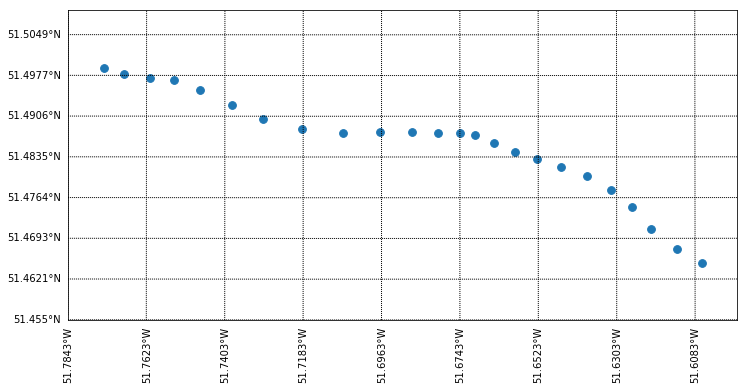

Plotting metocean data...


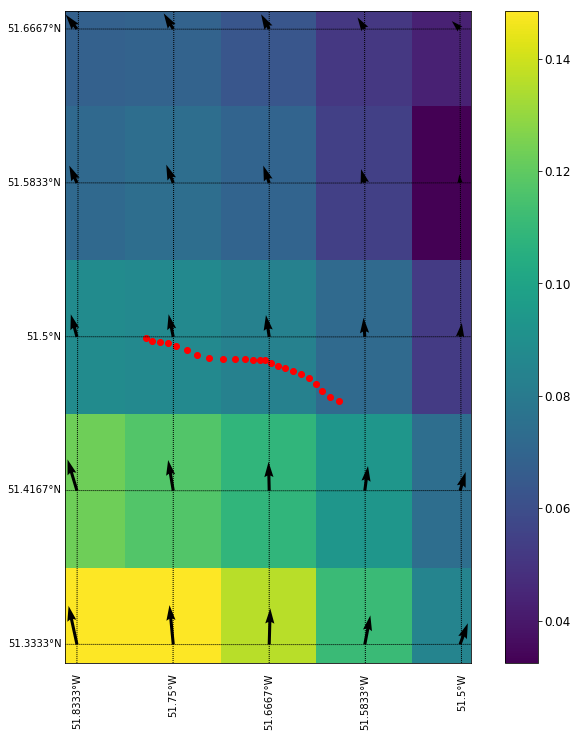

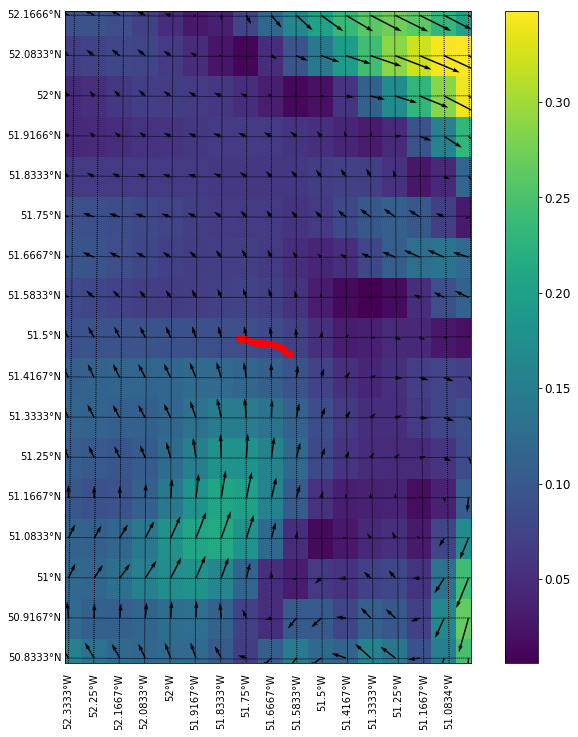

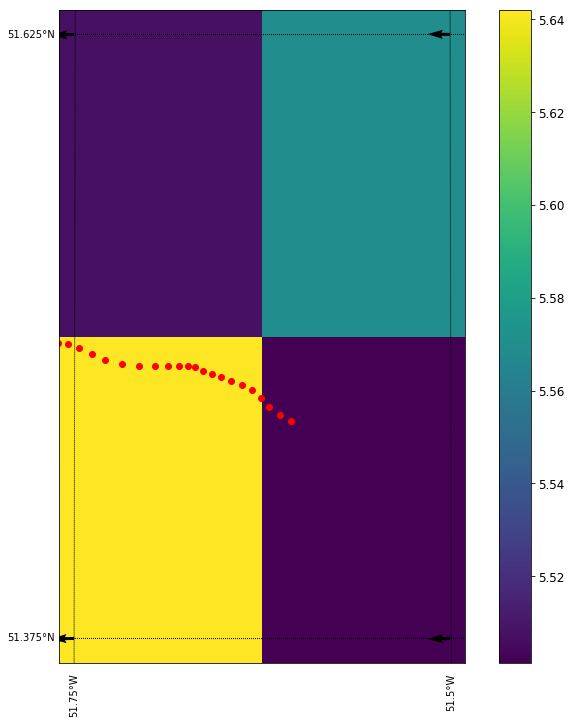

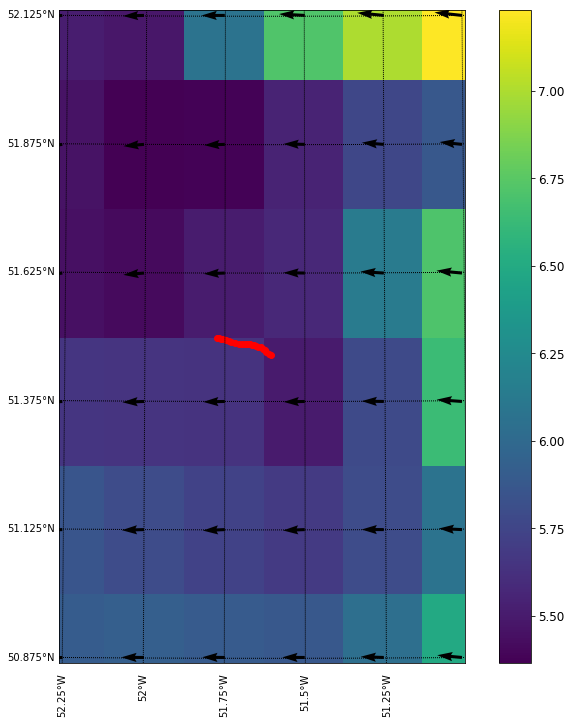

Optimizing Ca and Cw...


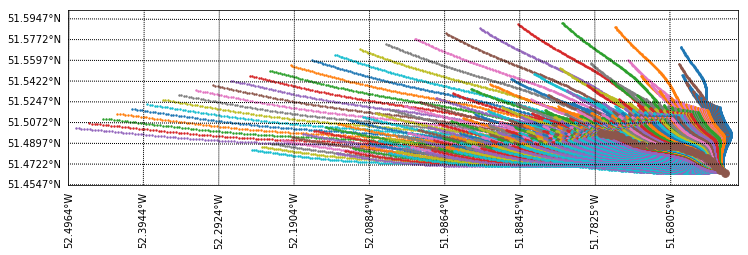

Plotting optimized track...
err: 0.0055792377962742695, Ca: 0.8999999999999999, Cw: 0.7


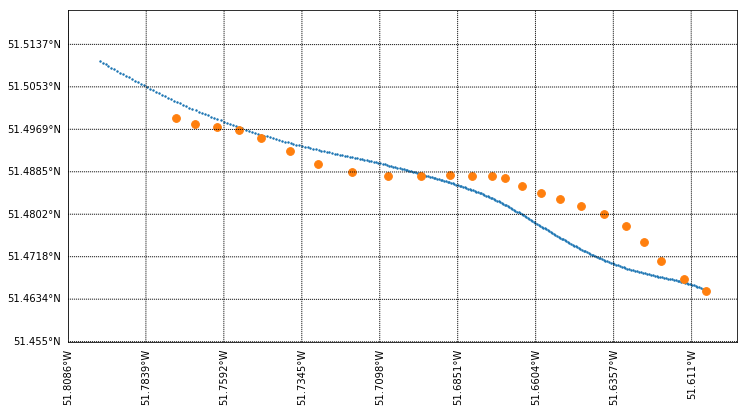

Running ensemble...


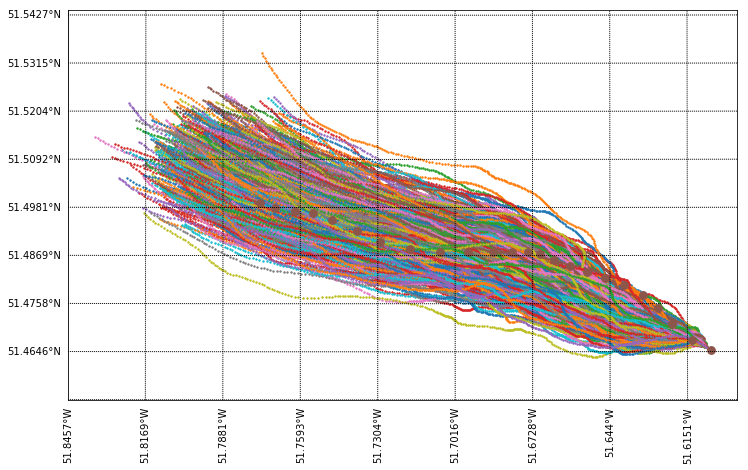

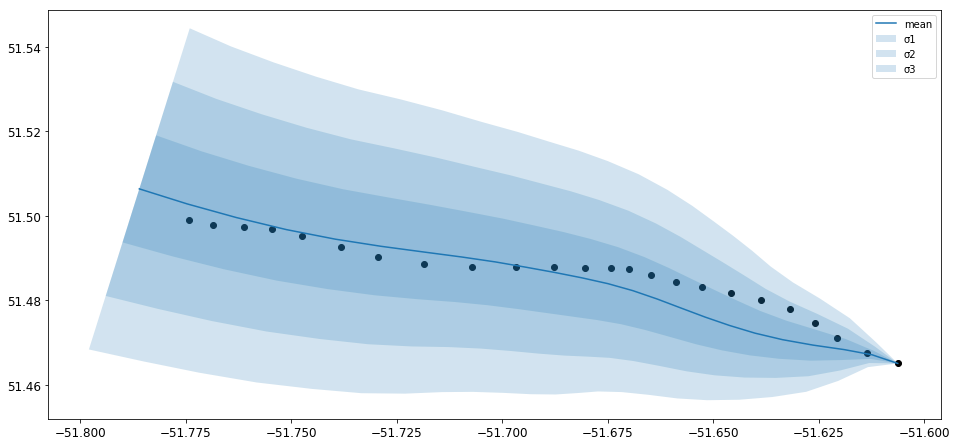

Day 1


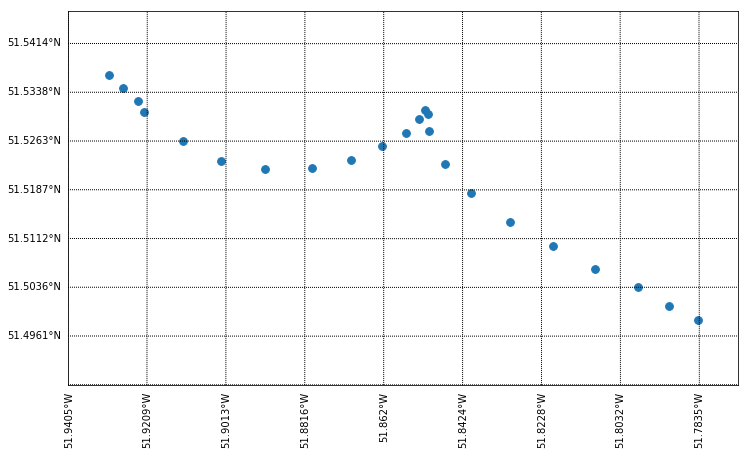

Plotting metocean data...


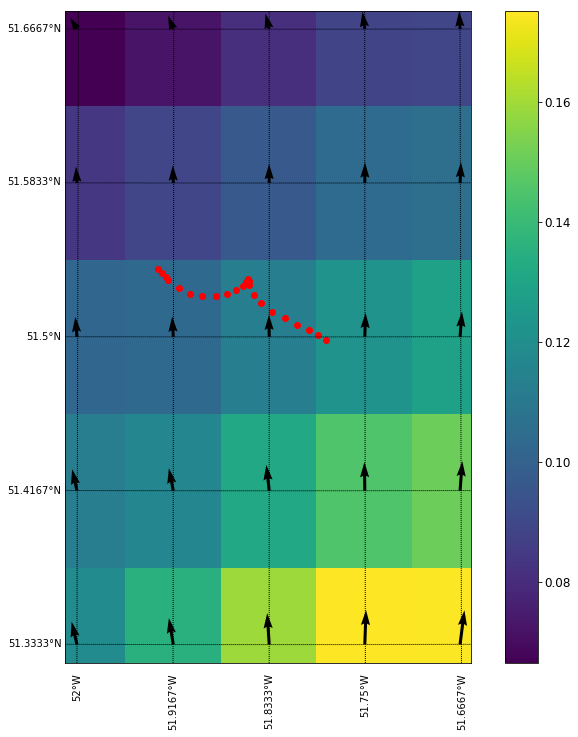

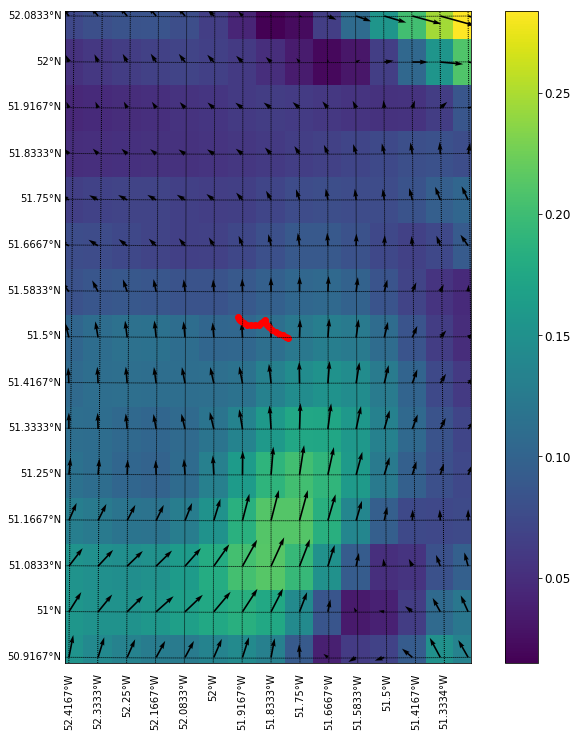

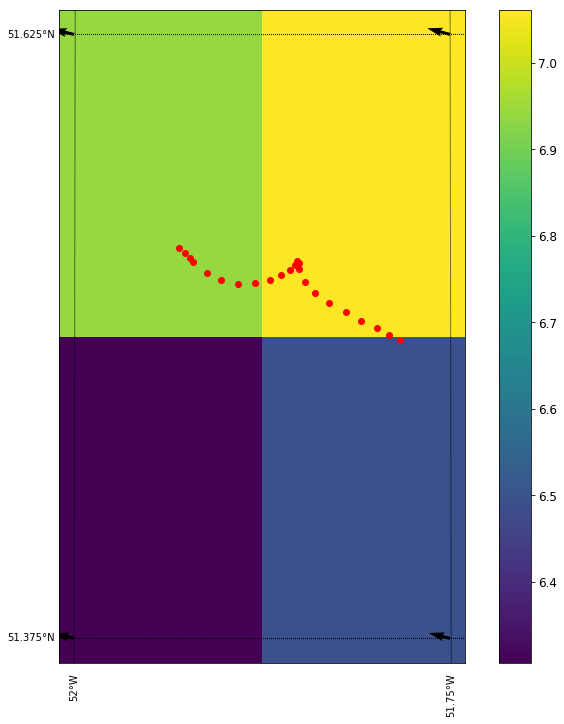

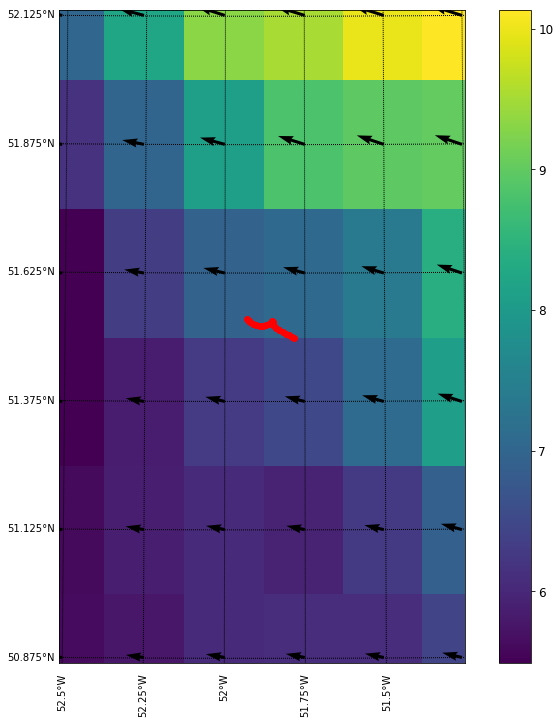

Optimizing Ca and Cw...


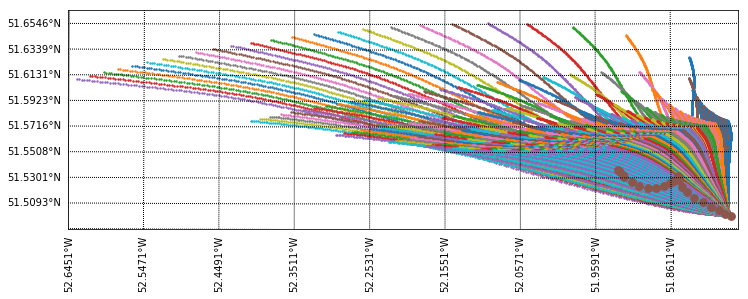

Plotting optimized track...
err: 0.012995898365415726, Ca: 2.5, Cw: 2.5


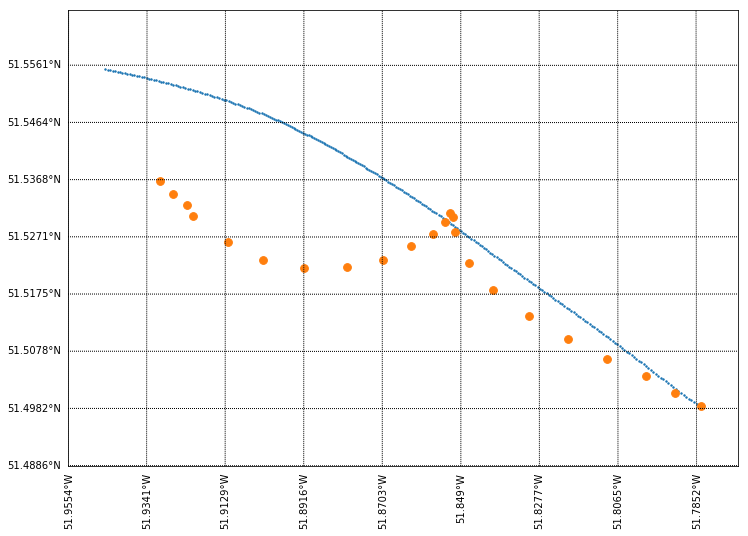

Running ensemble...


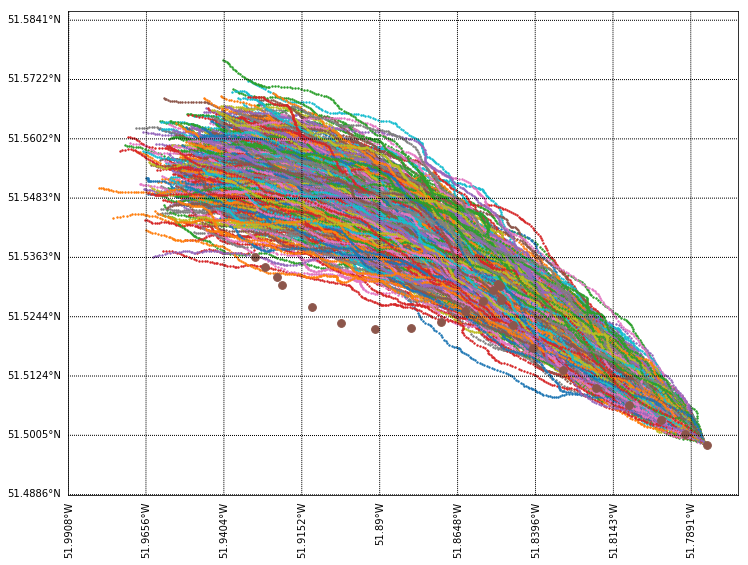

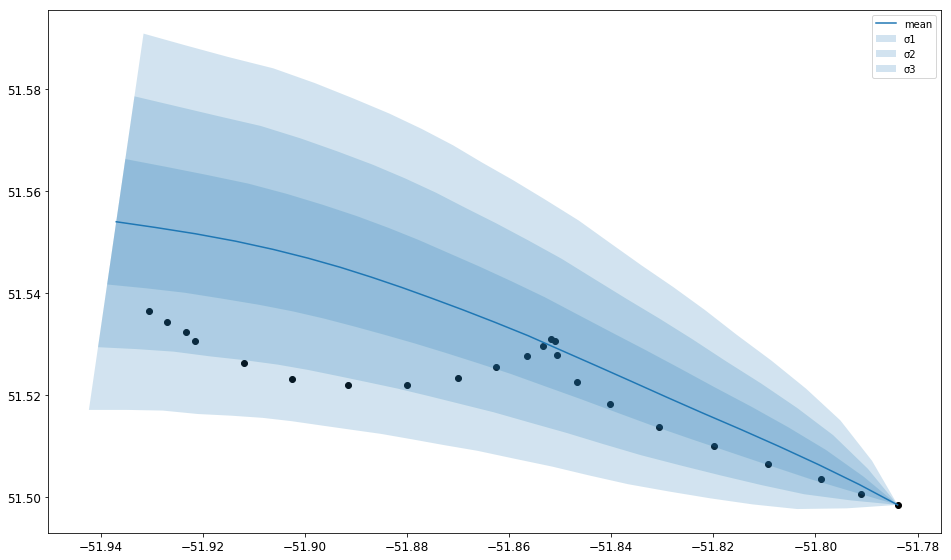

Day 2


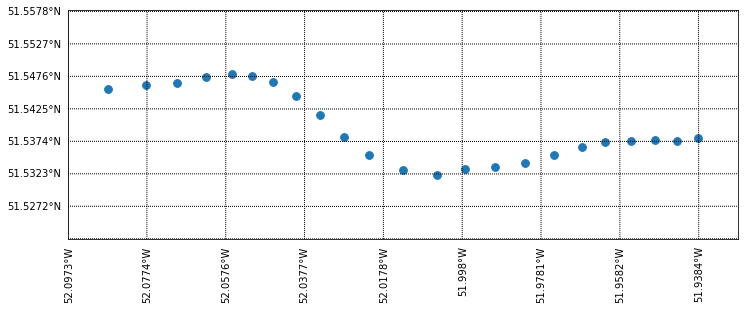

Plotting metocean data...


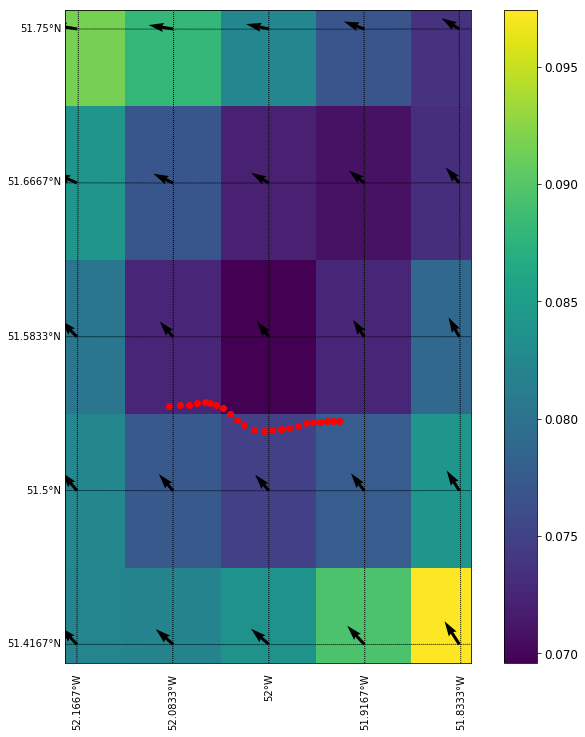

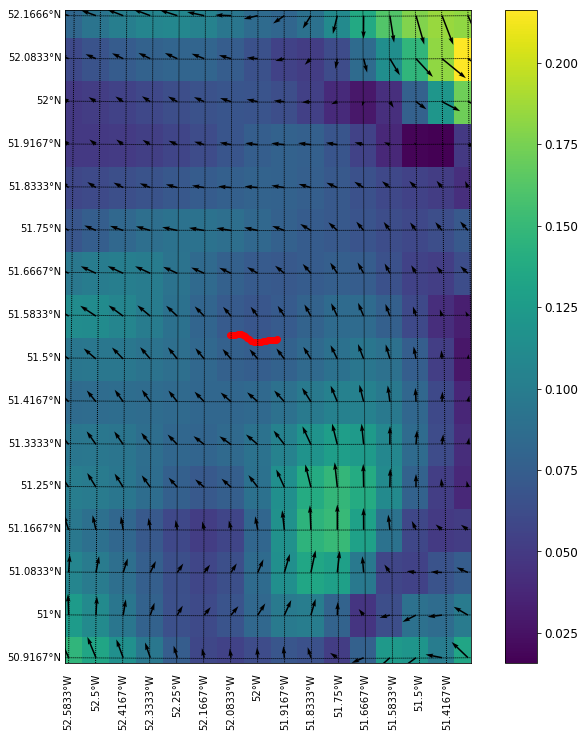

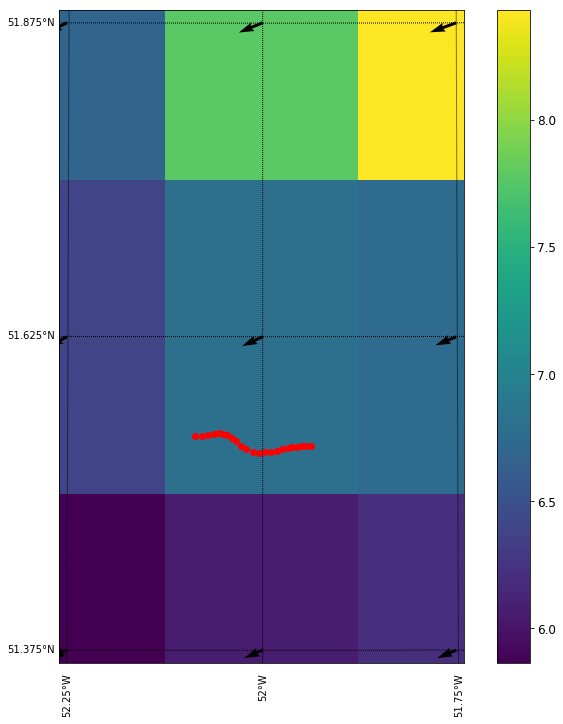

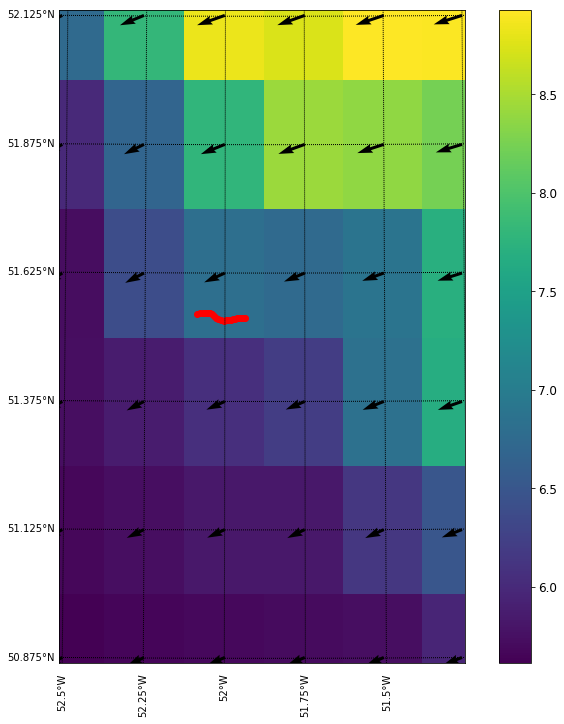

Optimizing Ca and Cw...


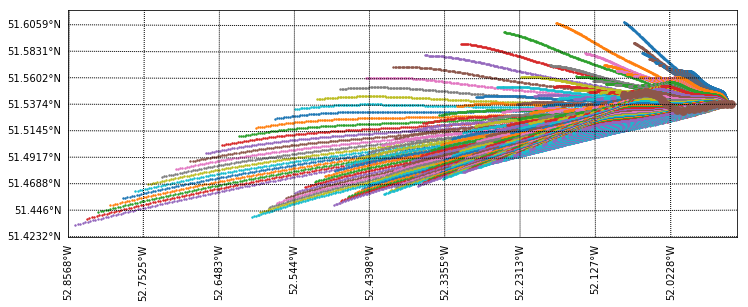

Plotting optimized track...
err: 0.005245256593075407, Ca: 0.5, Cw: 1.0999999999999999


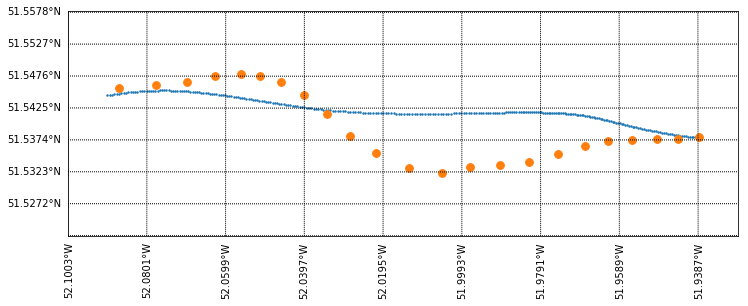

Running ensemble...


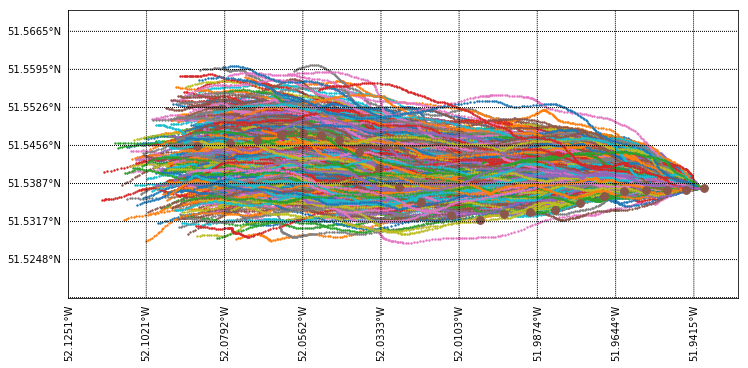

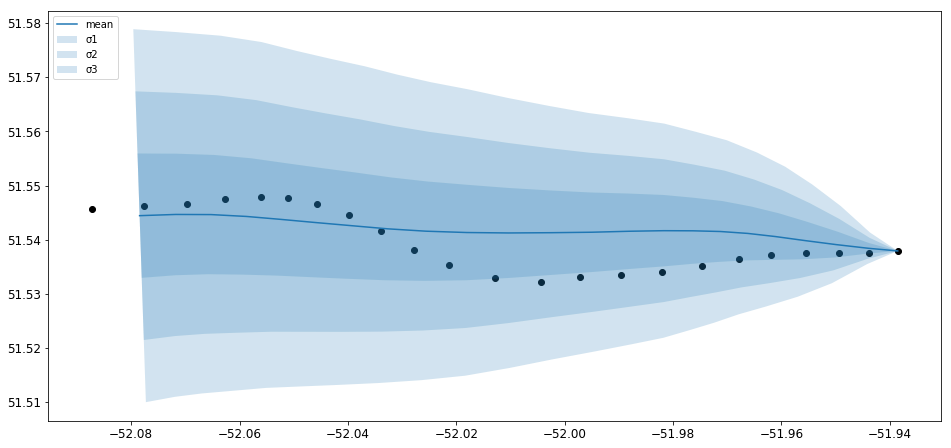

Day 3


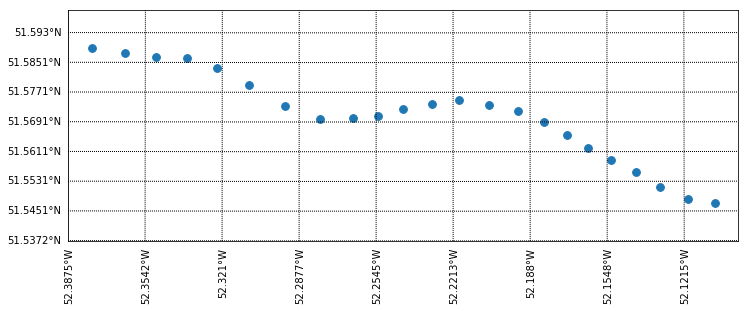

Plotting metocean data...


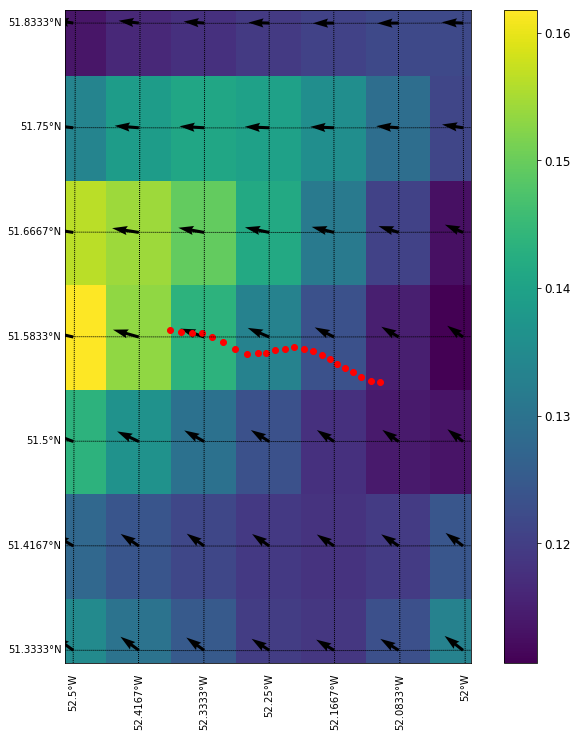

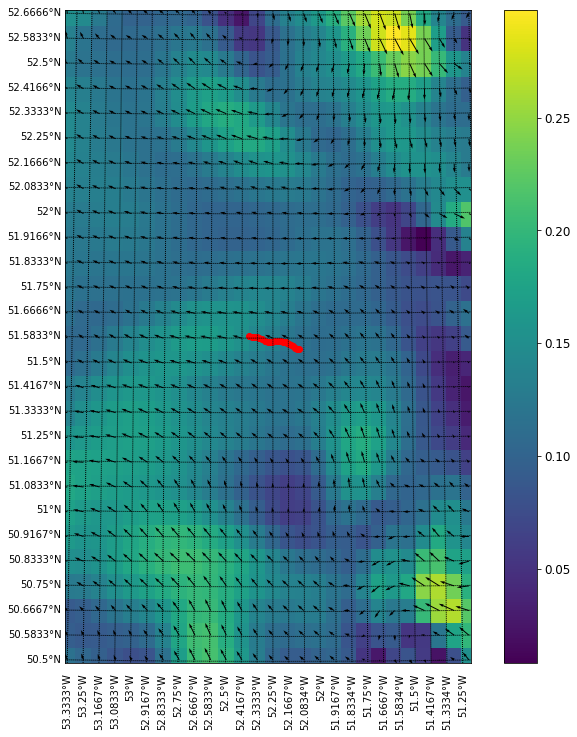

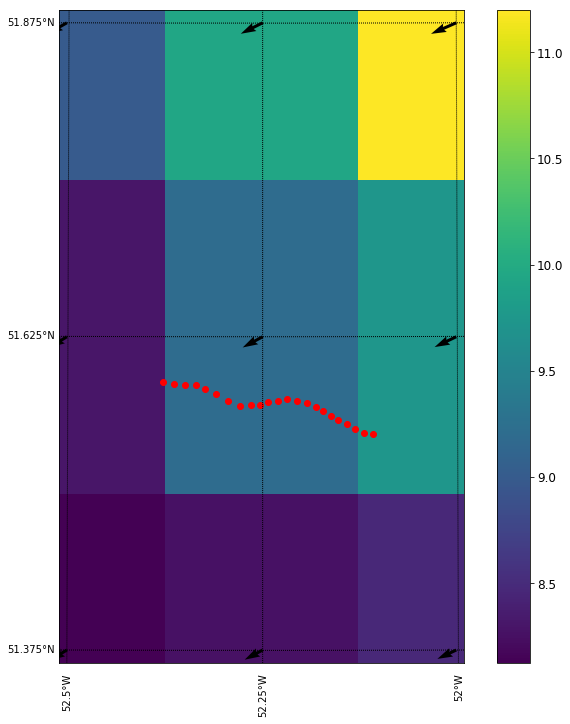

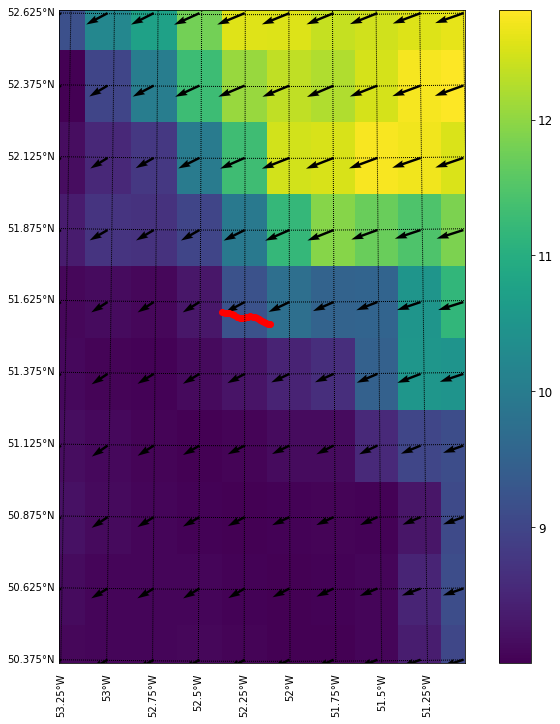

Optimizing Ca and Cw...


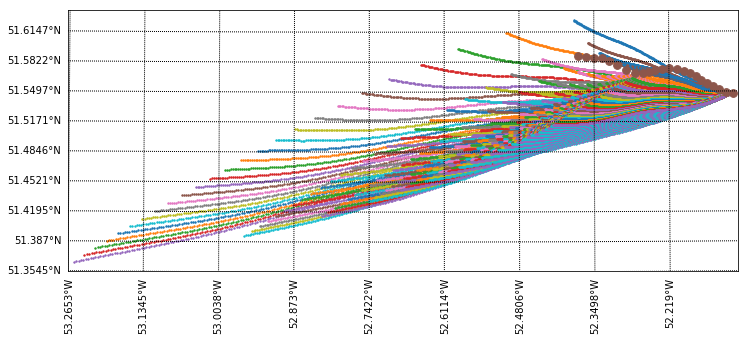

Plotting optimized track...
err: 0.013147542711451016, Ca: 0.1, Cw: 0.2


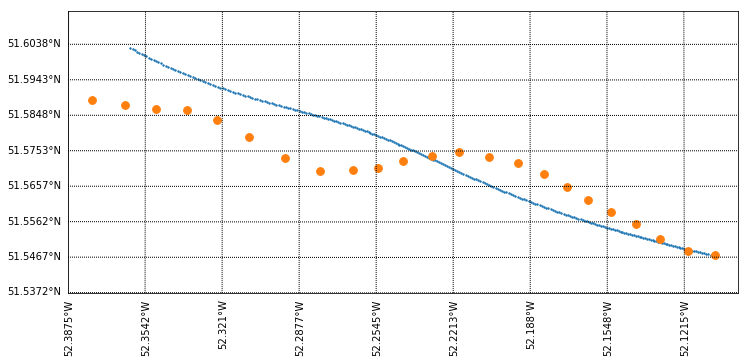

Running ensemble...


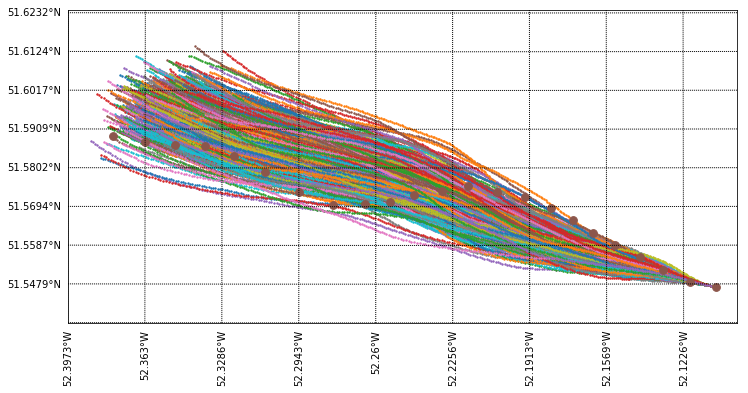

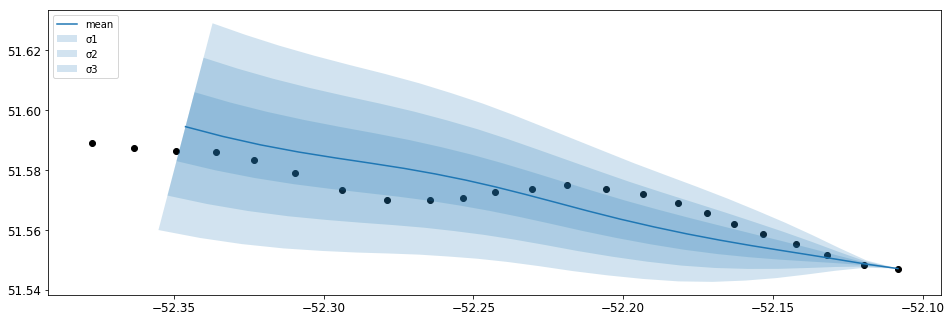

Day 4


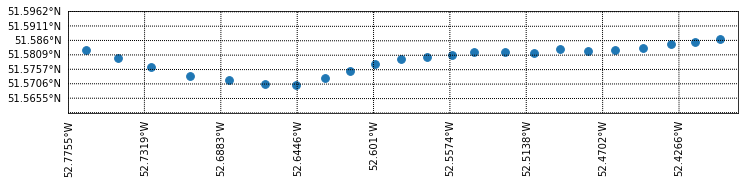

Plotting metocean data...


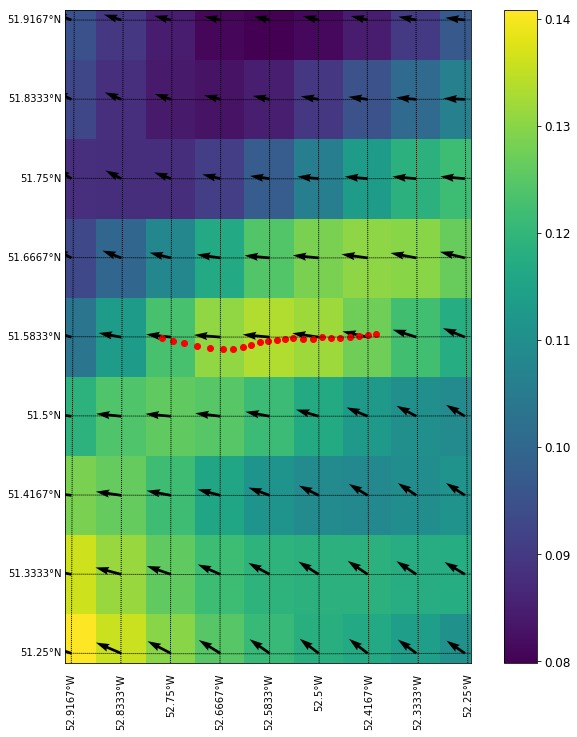

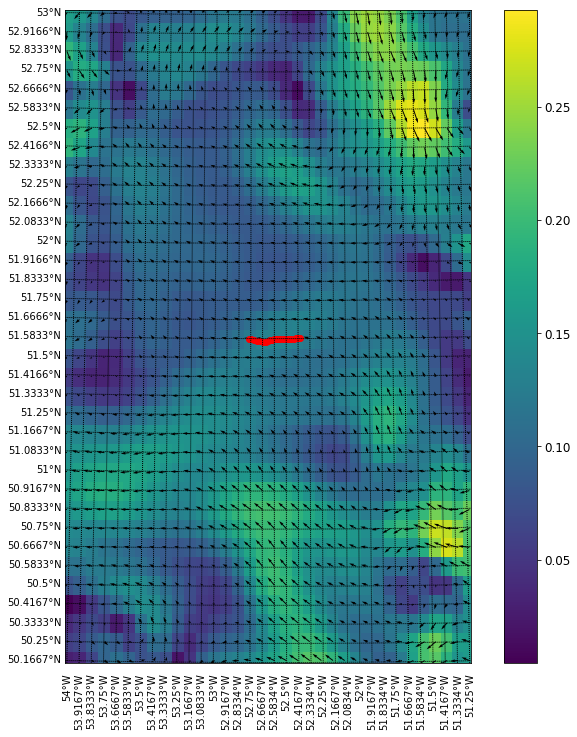

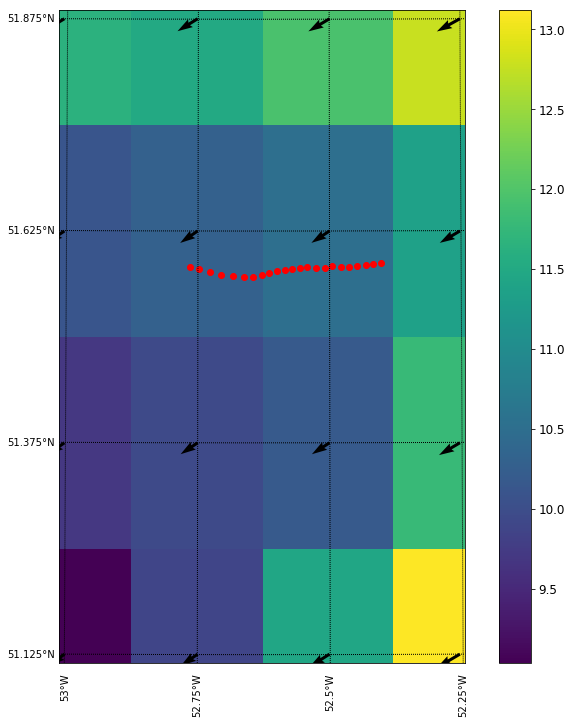

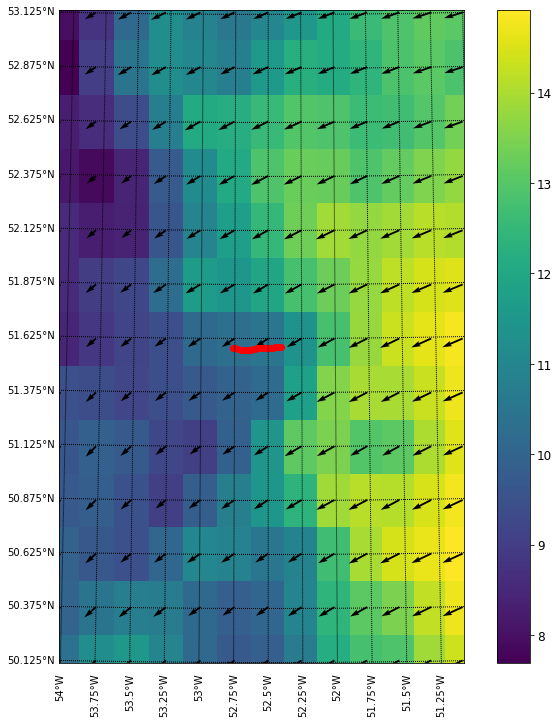

Optimizing Ca and Cw...


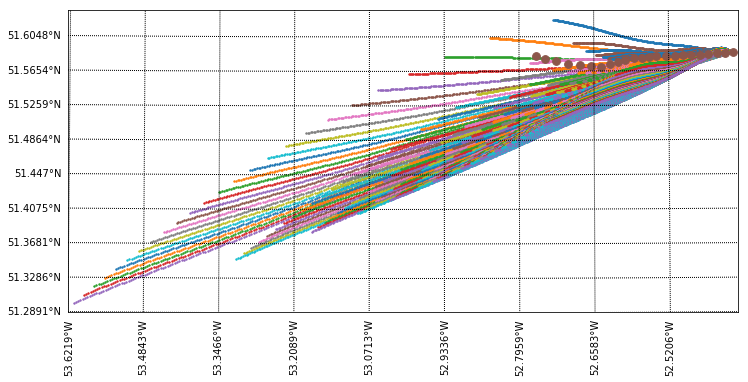

Plotting optimized track...
err: 0.008675490645446758, Ca: 0.2, Cw: 0.2


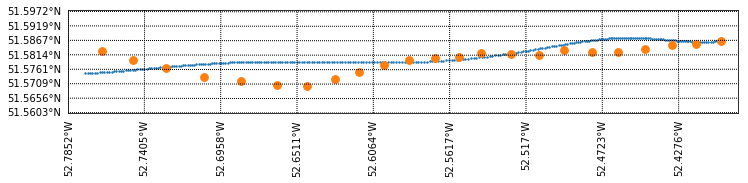

Running ensemble...


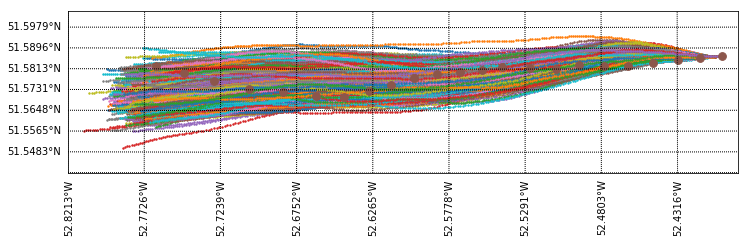

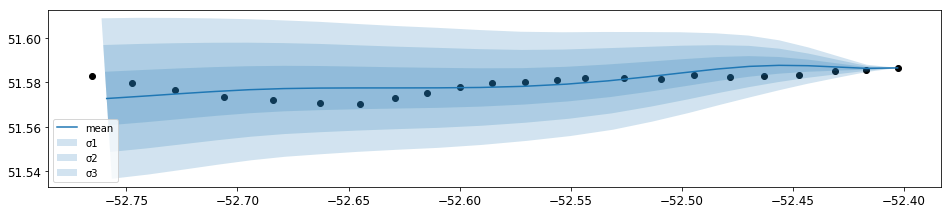

Day 5


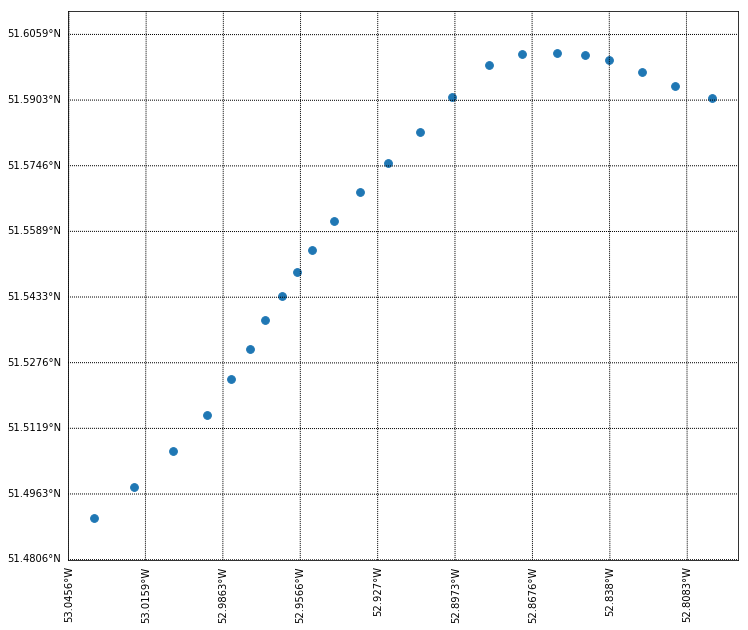

Plotting metocean data...


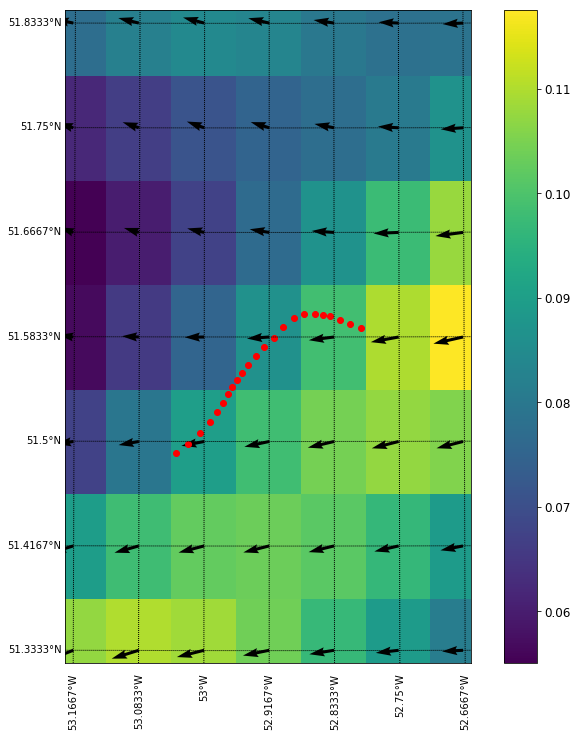

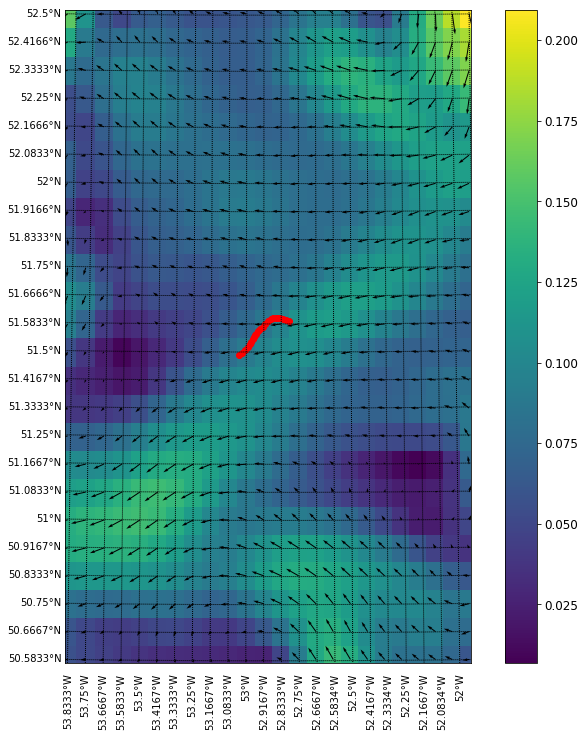

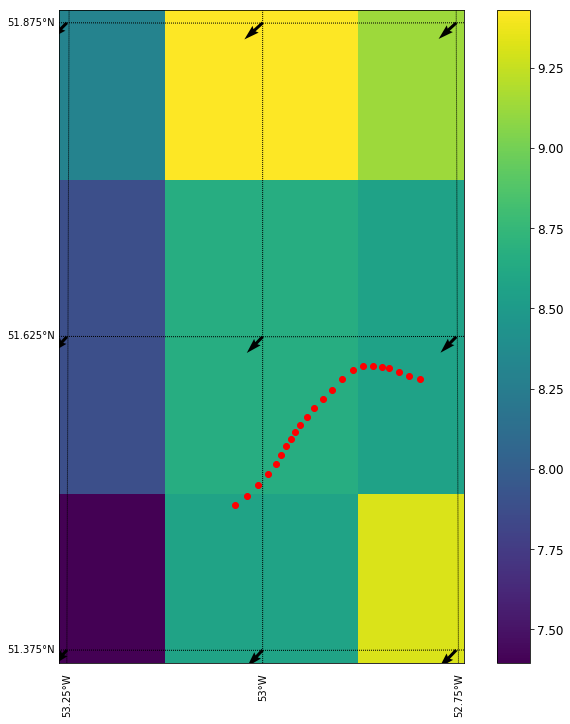

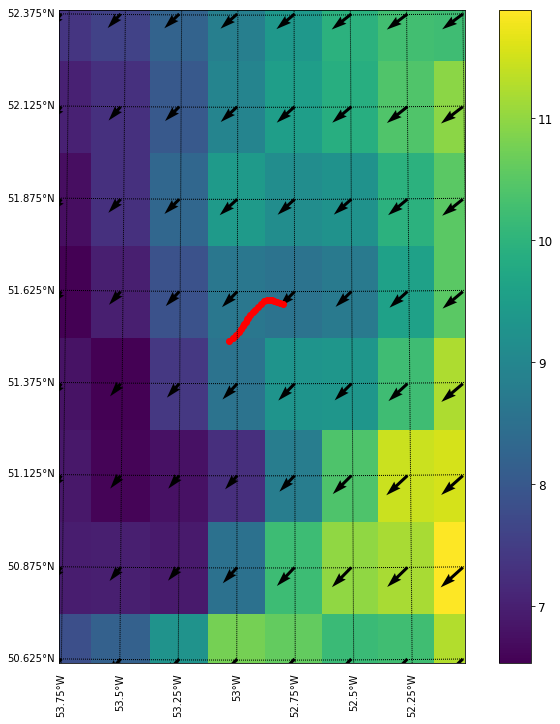

Optimizing Ca and Cw...


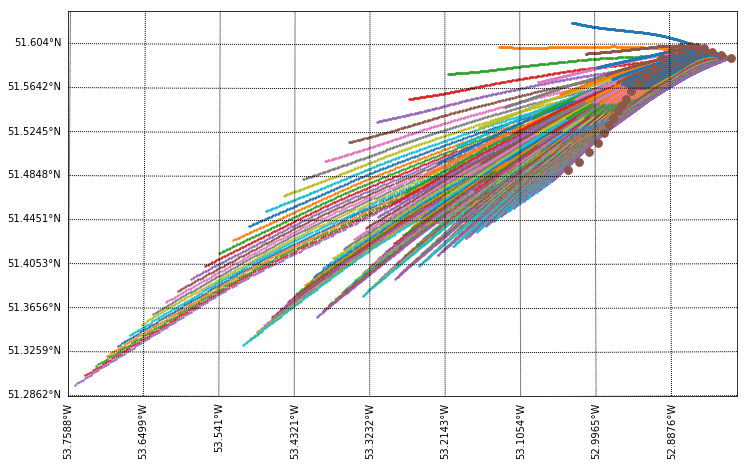

Plotting optimized track...
err: 0.013274455639856186, Ca: 0.7999999999999999, Cw: 1.2


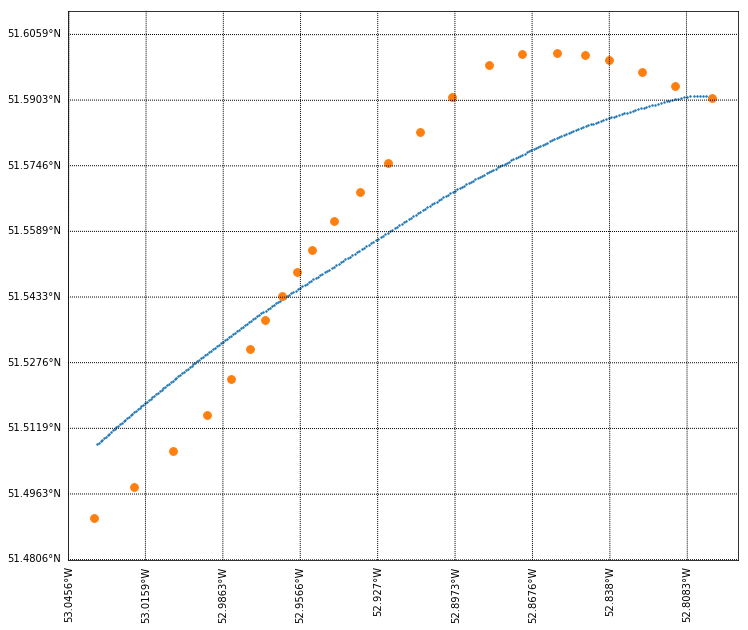

Running ensemble...


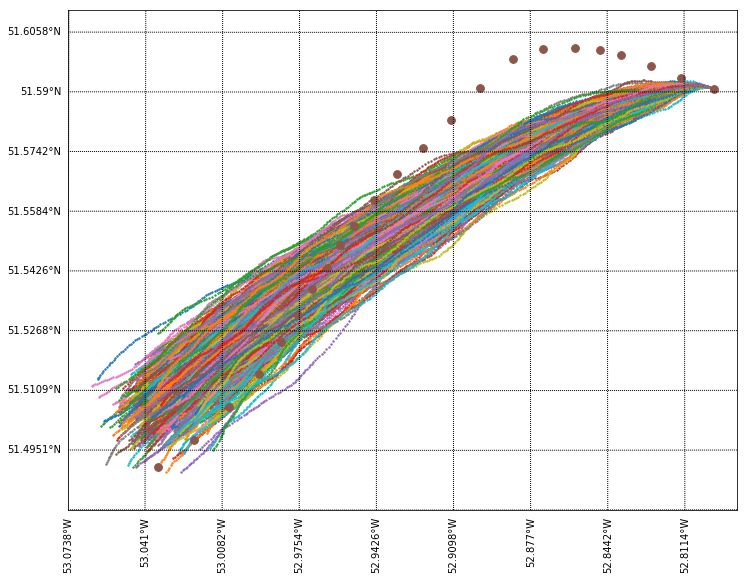

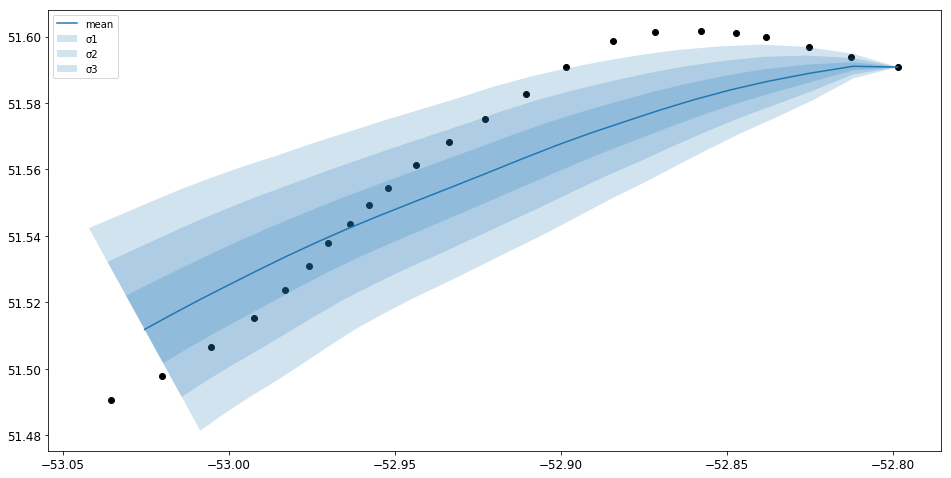

Day 6


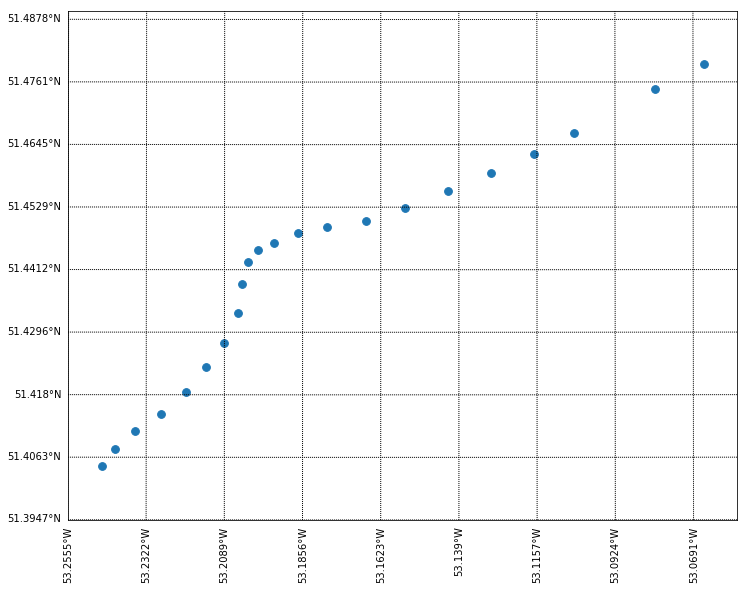

Plotting metocean data...


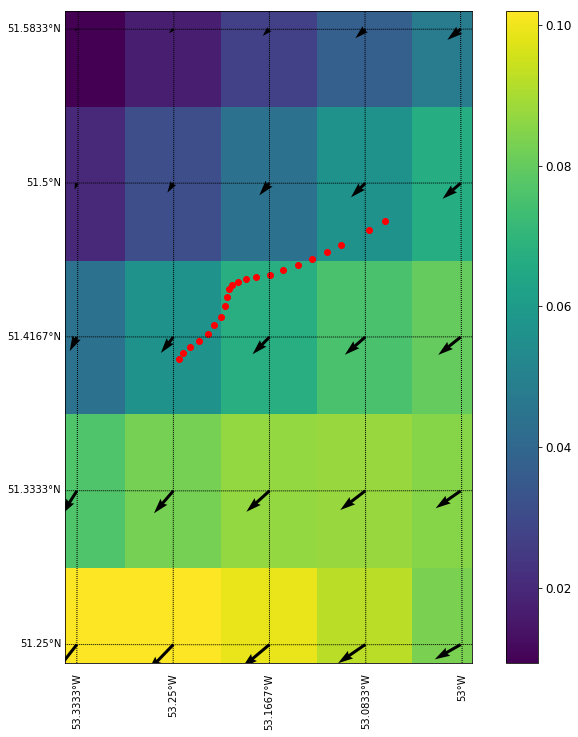

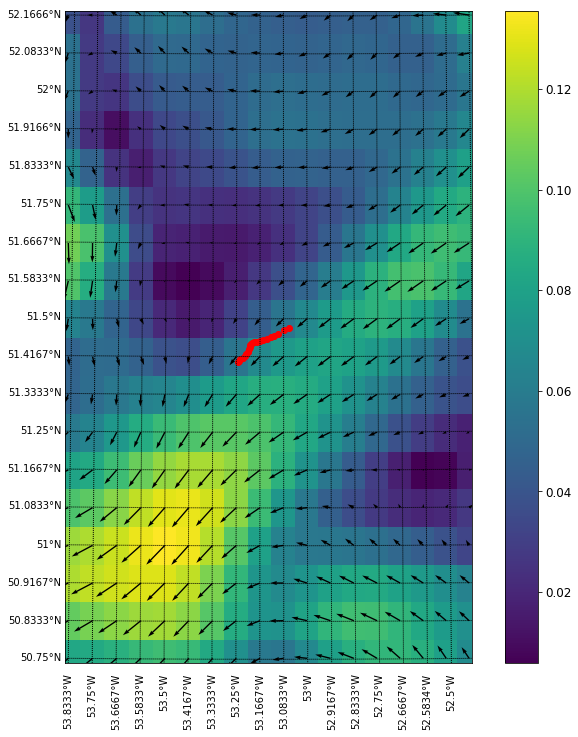

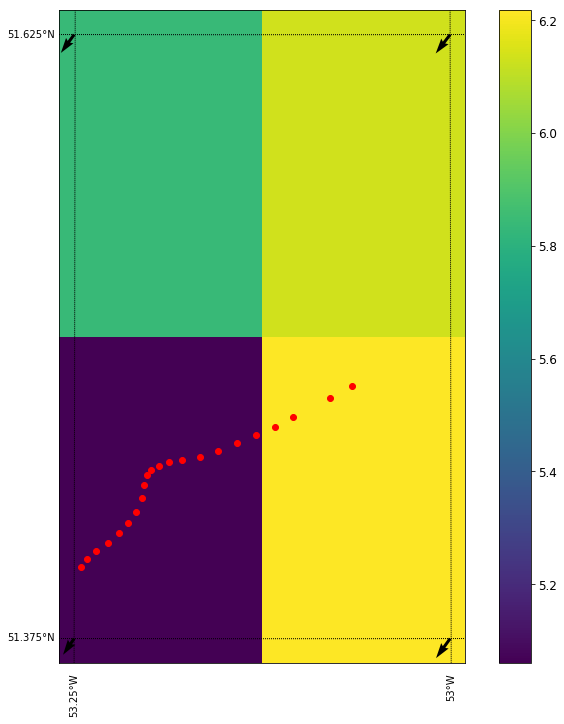

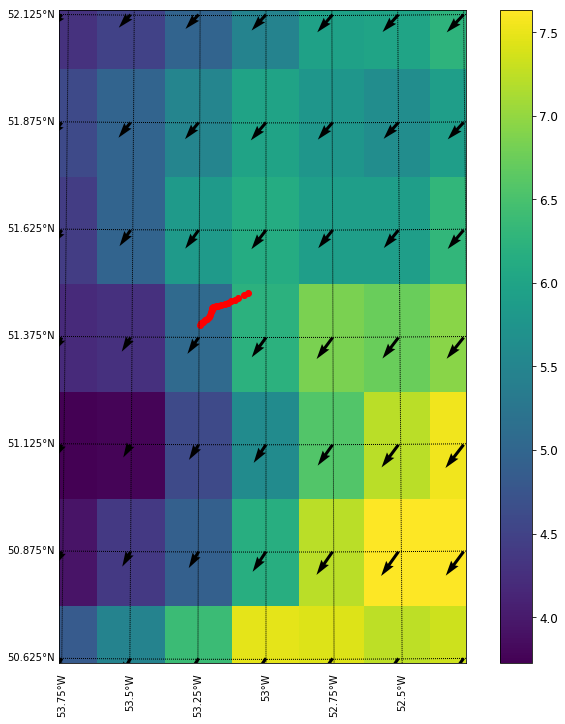

Optimizing Ca and Cw...


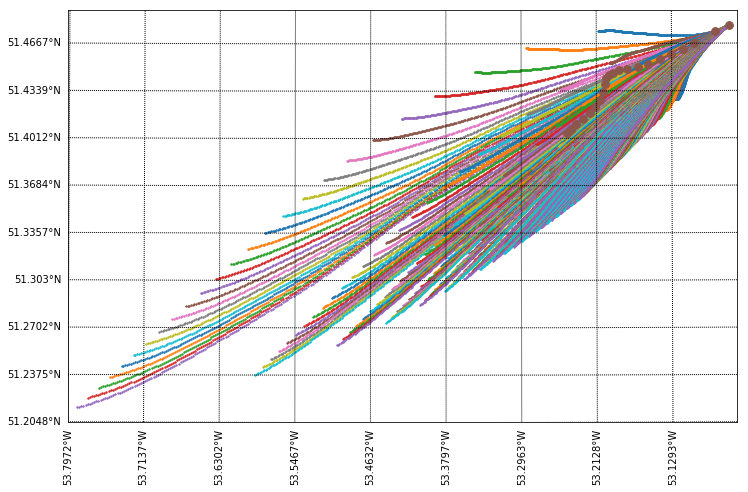

Plotting optimized track...
err: 0.009277444117463167, Ca: 0.3, Cw: 0.3


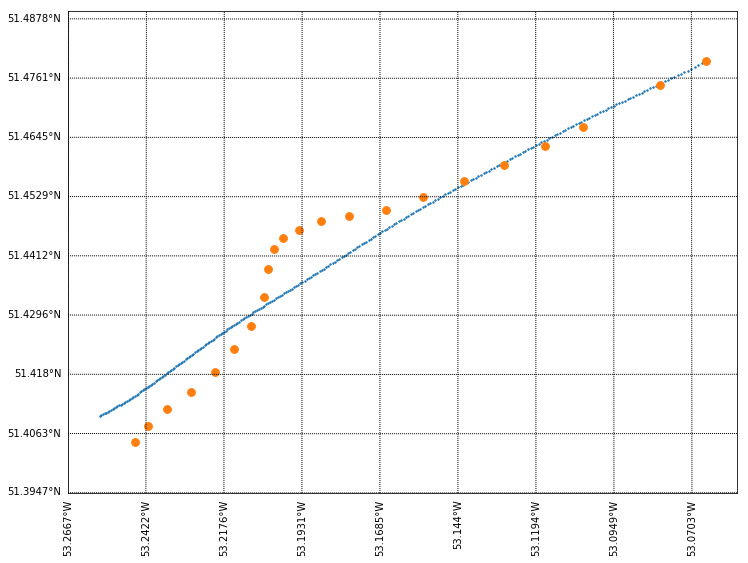

Running ensemble...


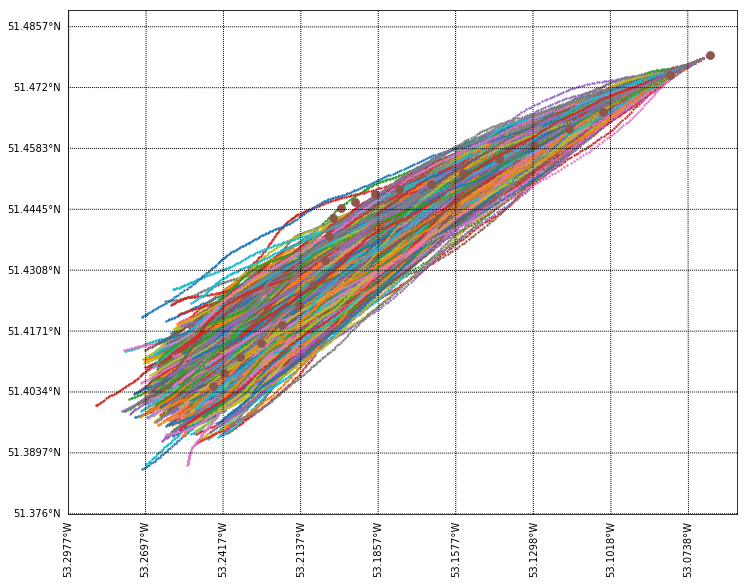

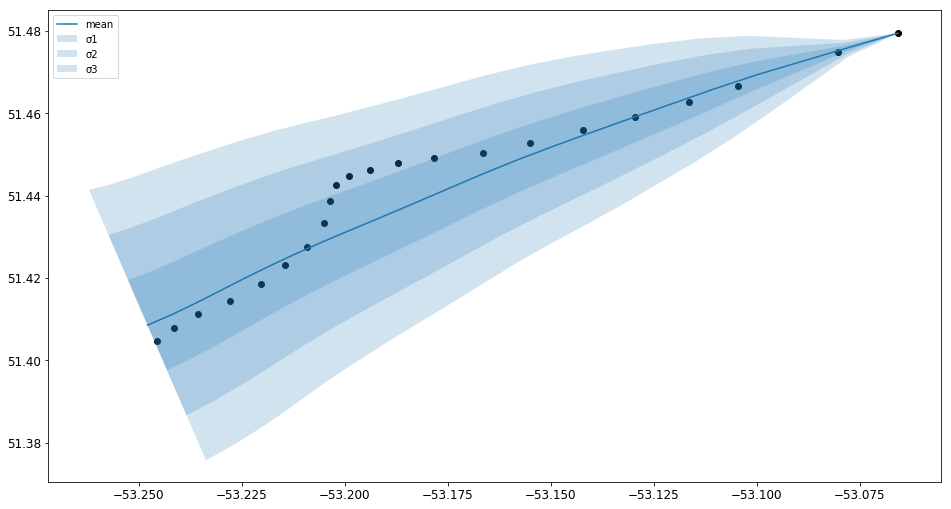

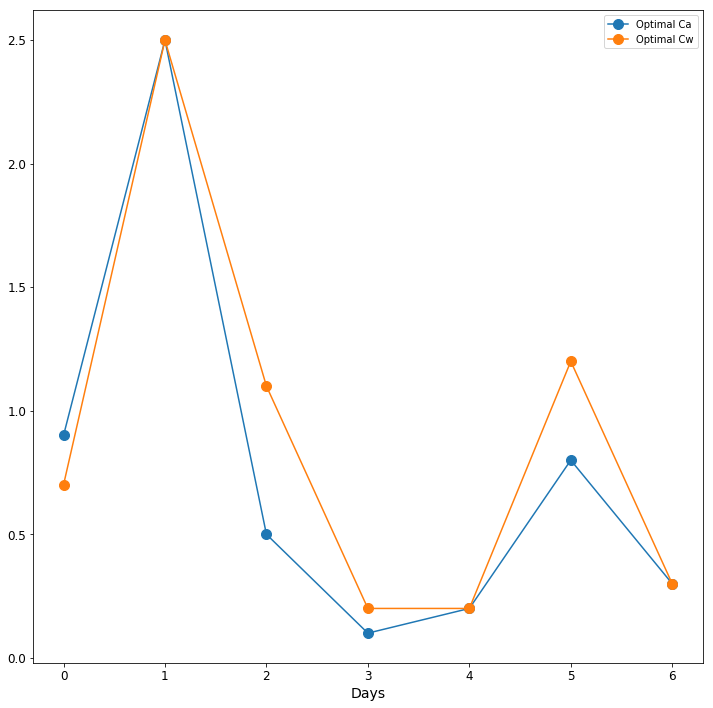

In [9]:
num_days = 7
days = range(num_days)
#days = [2]

optimal_Cas = np.empty(num_days)
optimal_Cws = np.empty(num_days)


for day in days:
    
    print(f'Day {day}')
    
    start_time = df.DataDate_UTC.values[809] + np.timedelta64(day, 'D')
    end_time = start_time + np.timedelta64(1, 'D')
    tc = test_case.TestCase(beacon_id=beacon_id, start_time=start_time, end_time=end_time)
    
    sim_args = tc.time_frame, tc.start_location, tc.start_velocity
    sim = simulator.Simulator(*sim_args, **{'ocean_model': 'ECMWF'})
    reference_data_dict = {'time': tc.ref_times, 'latitude': tc.ref_lats.values, 'longitude': tc.ref_lons.values}
    sim.results.add_from_dict(reference_data_dict, label='reference')
    sim.testcase = tc
    
    optimal_Cas[day], optimal_Cws[day] = main(tc, sim)
    
    del sim
    del tc
    
    gc.collect()

plt.plot(range(len(optimal_Cas)), optimal_Cas, '.-', markersize=20, label='Optimal Ca')
plt.plot(range(len(optimal_Cws)), optimal_Cws, '.-', markersize=20, label='Optimal Cw')
plt.xlabel('Days')
plt.legend()
plt.show()

# Bad Berg

In [10]:
beacon_id = '50519'
df = sd.get_beacon_df(beacon_id=beacon_id)
# note index 809 is where the hourly averaging starts
start_time = df.DataDate_UTC.values[537]
end_time = start_time + np.timedelta64(1, 'D')
tc = test_case.TestCase(beacon_id=beacon_id, start_time=start_time, end_time=end_time)

Day 0


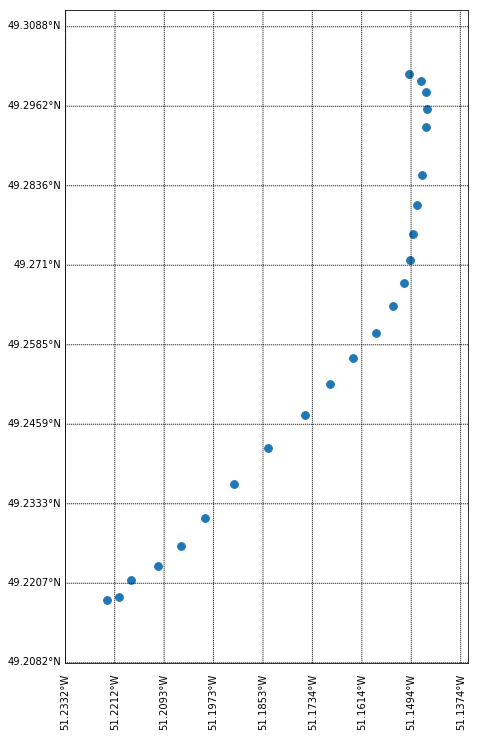

Plotting metocean data...


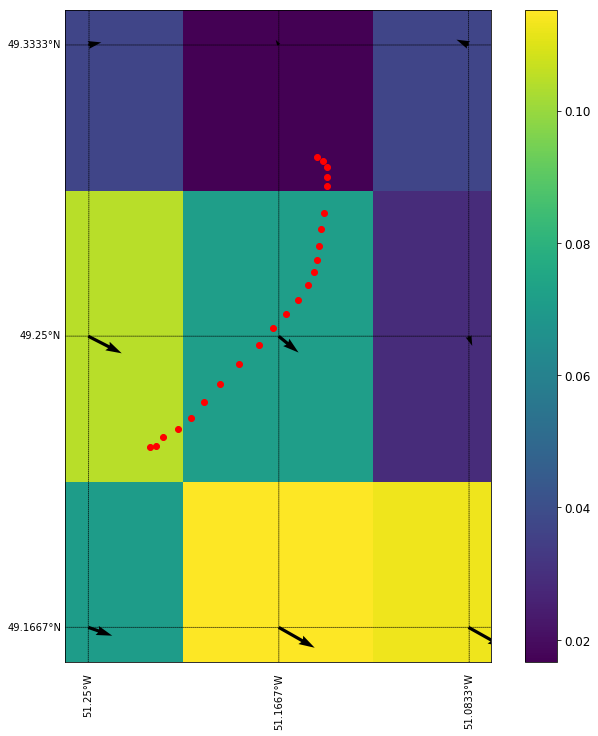

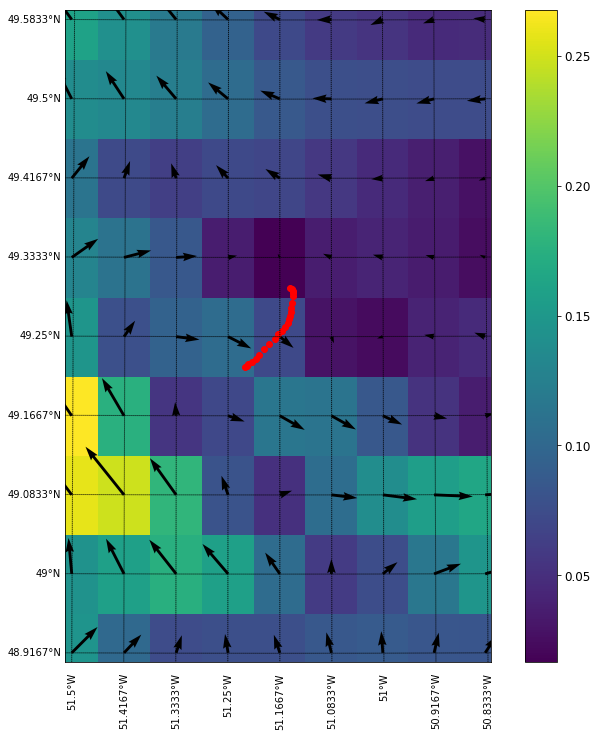

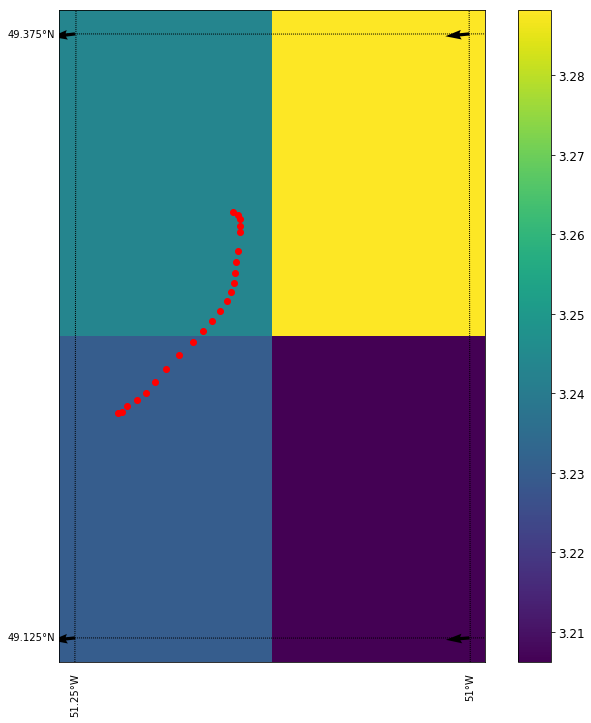

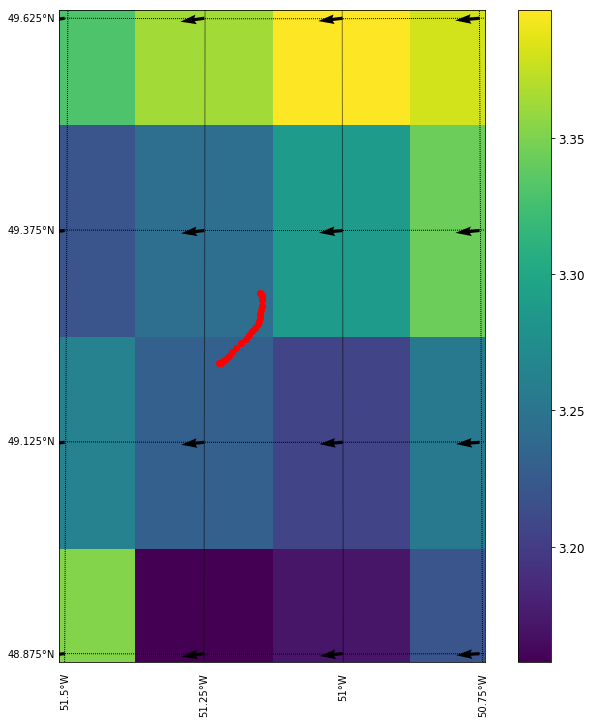

Optimizing Ca and Cw...


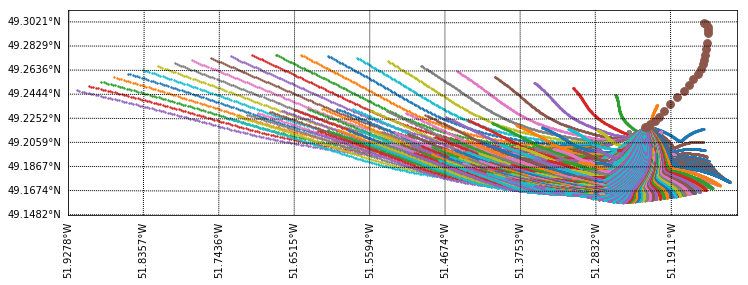

Plotting optimized track...
err: 0.049637372258452175, Ca: 0.1, Cw: 0.1


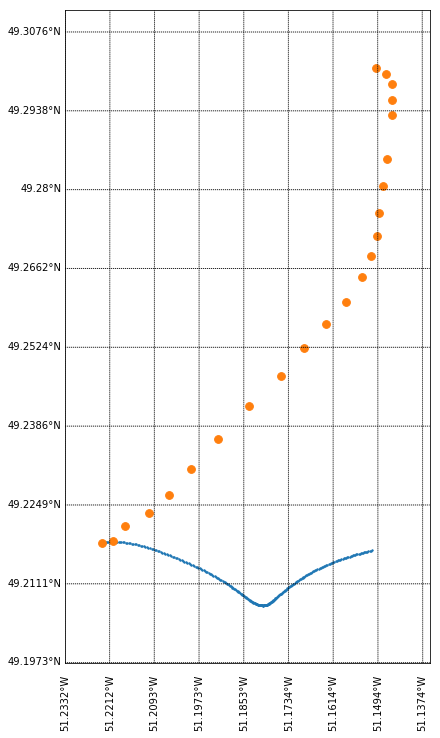

Running ensemble...


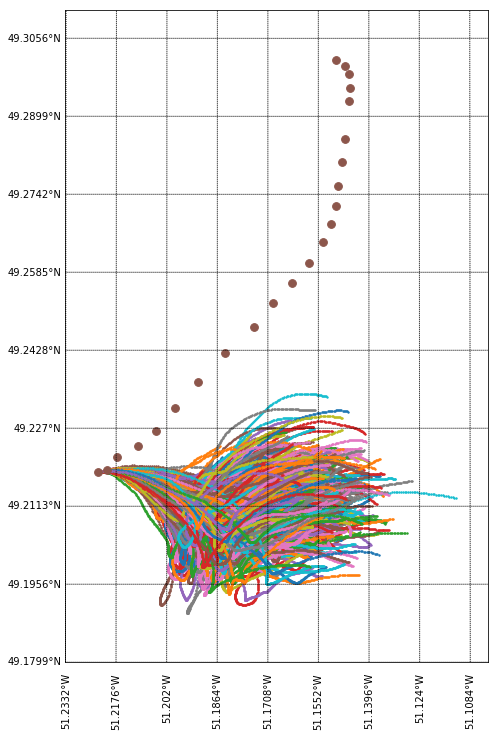

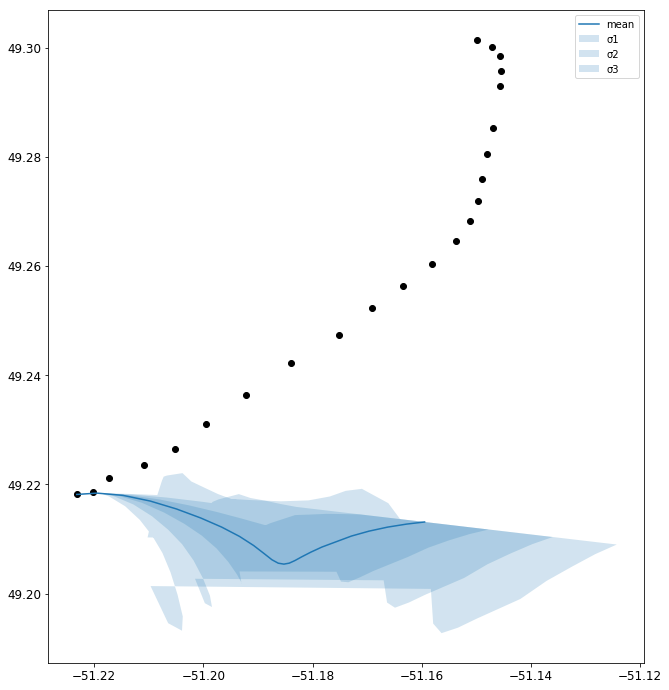

Day 1


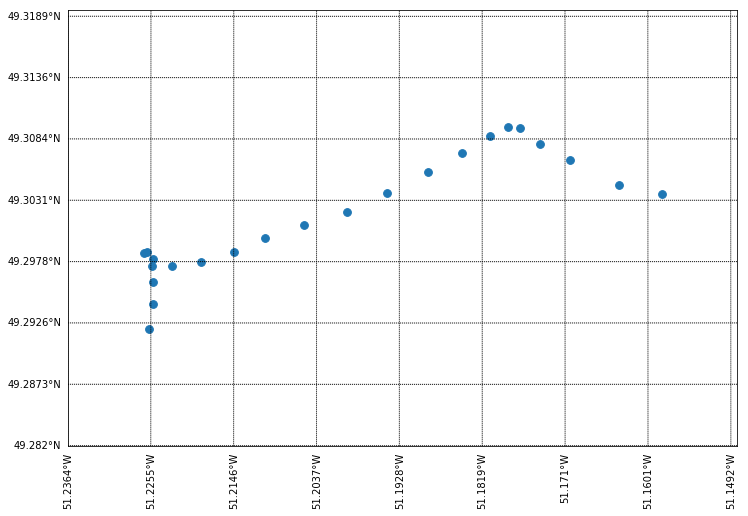

Plotting metocean data...


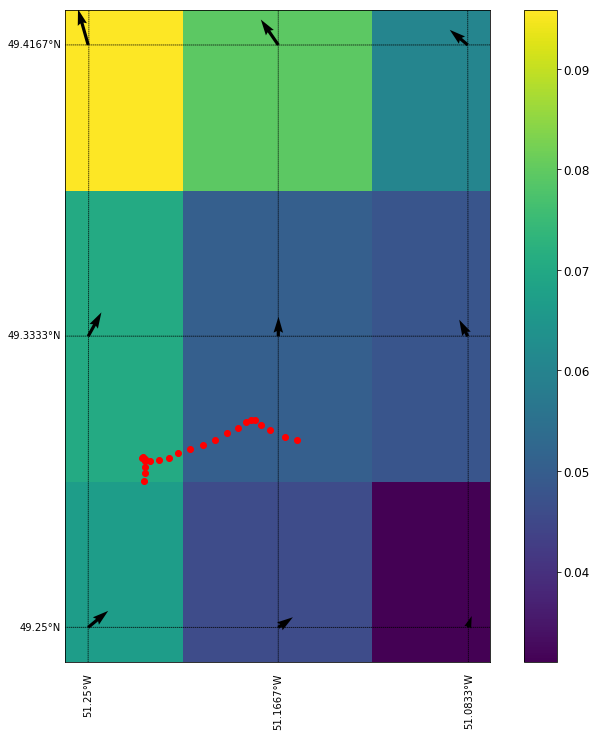

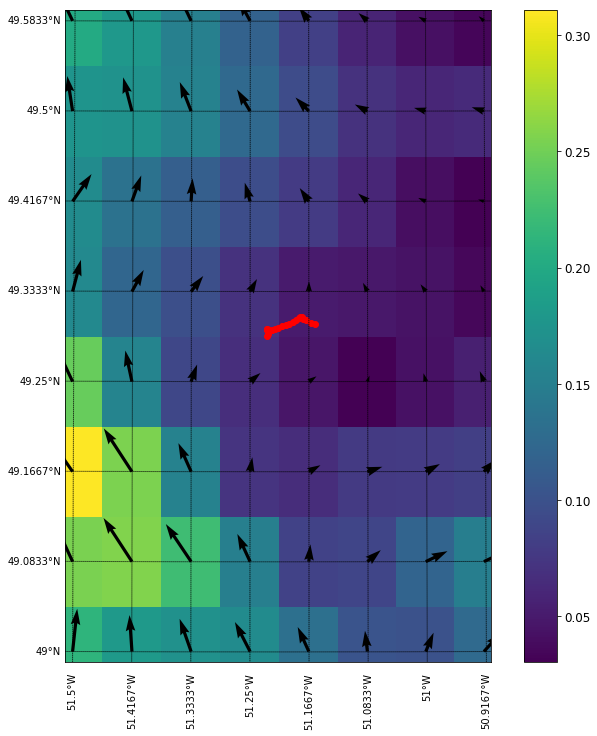

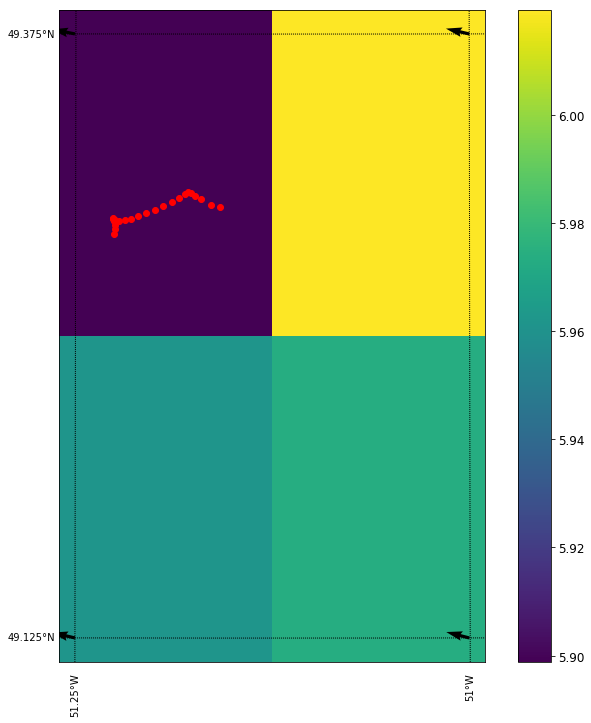

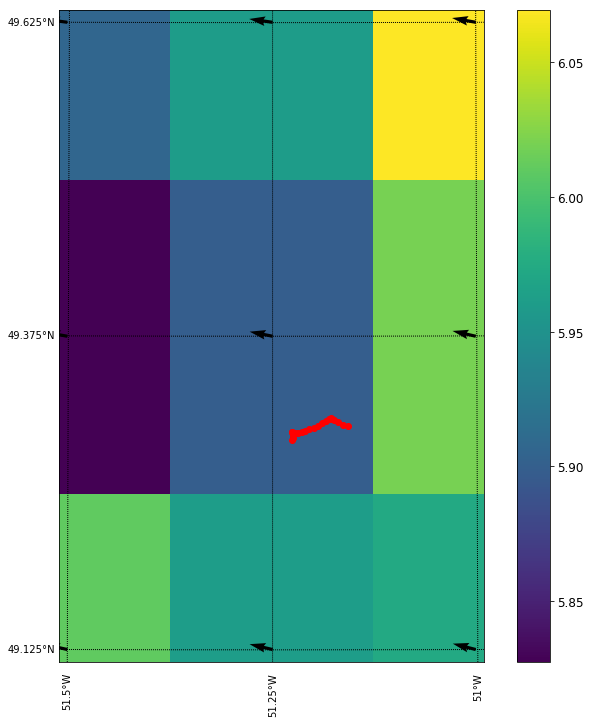

Optimizing Ca and Cw...


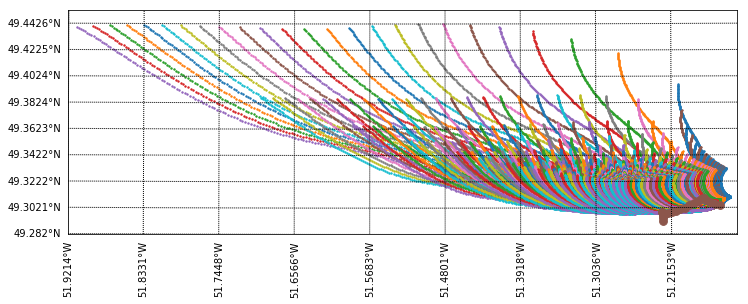

Plotting optimized track...
err: 0.011096472243880724, Ca: 2.0, Cw: 2.5


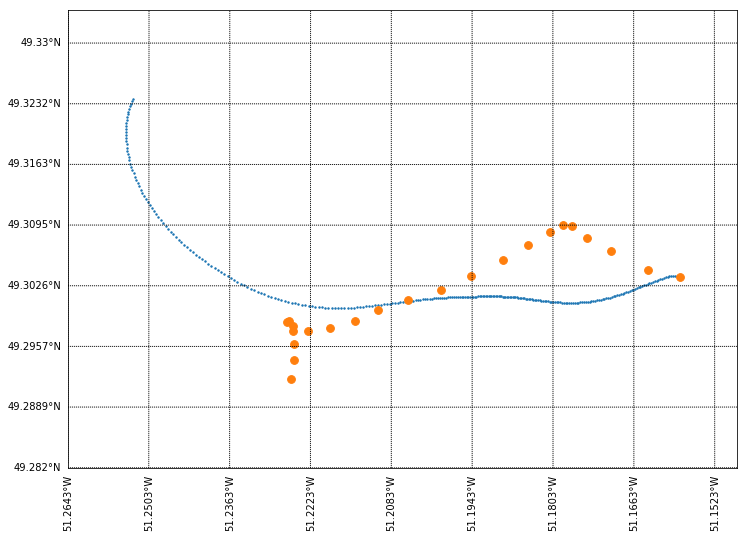

Running ensemble...


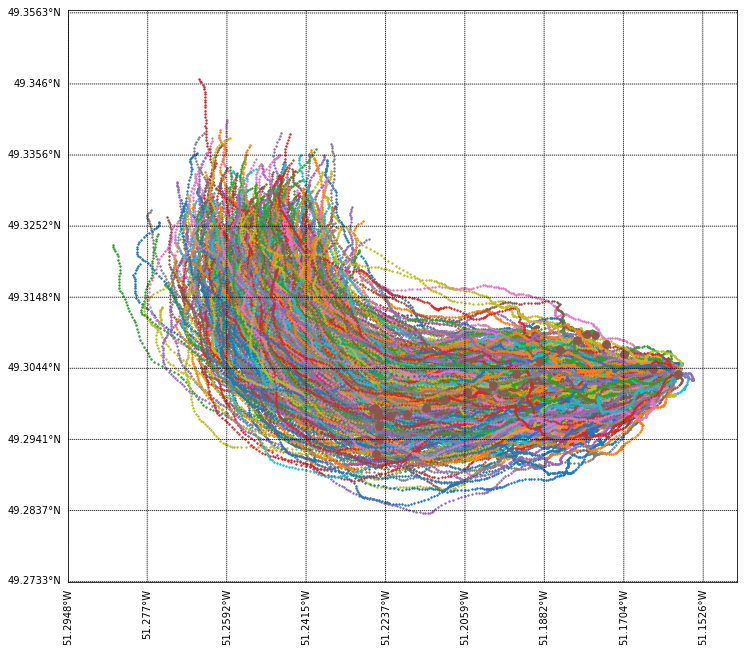

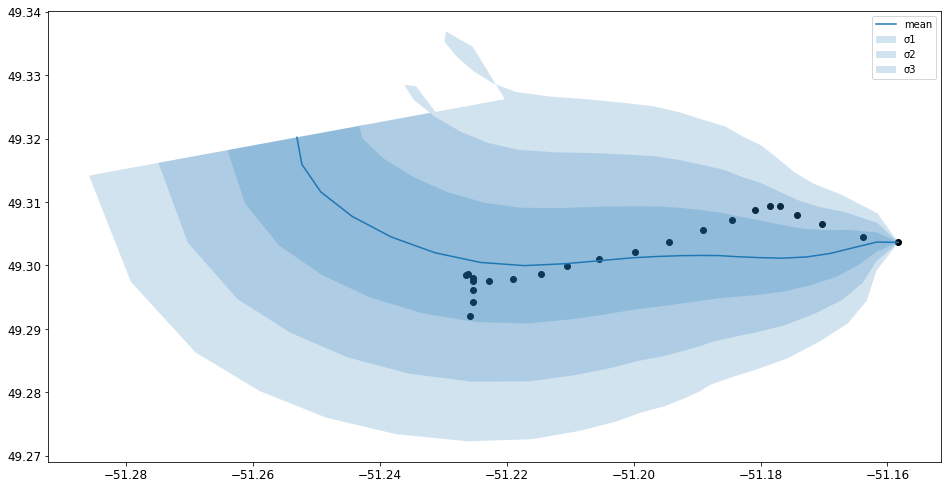

Day 2


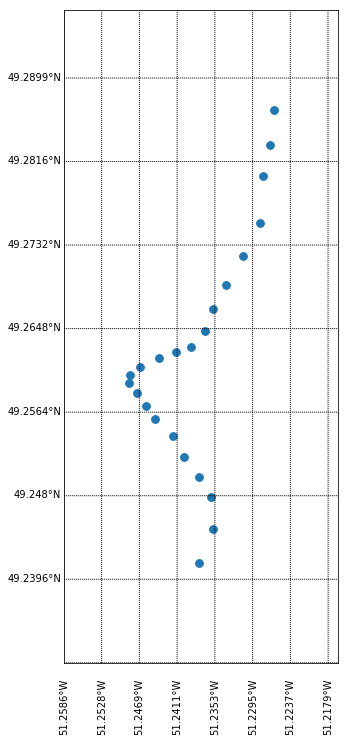

Plotting metocean data...


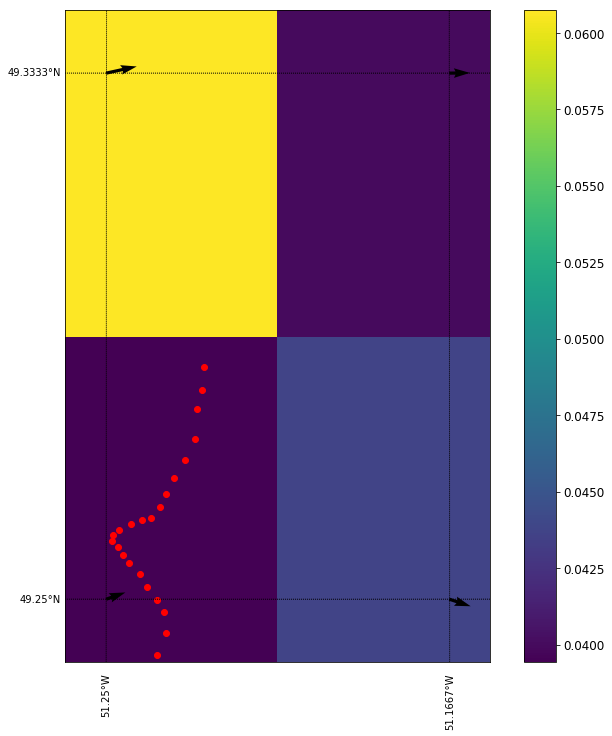

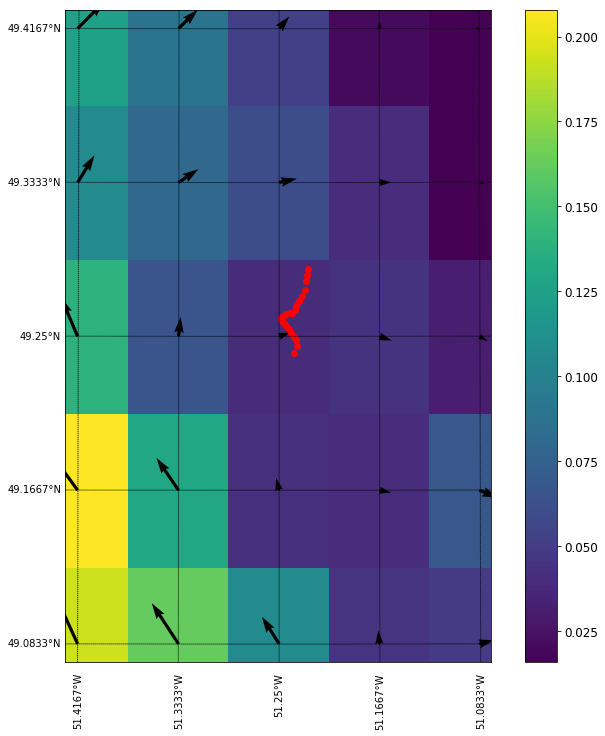

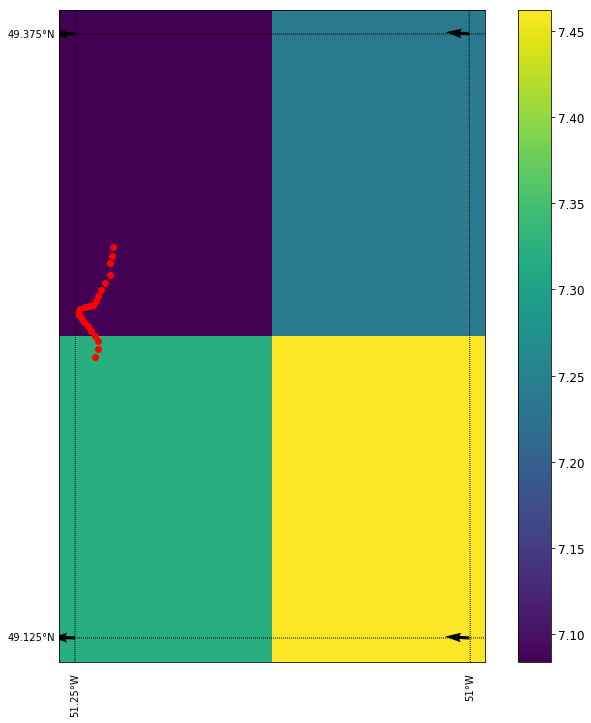

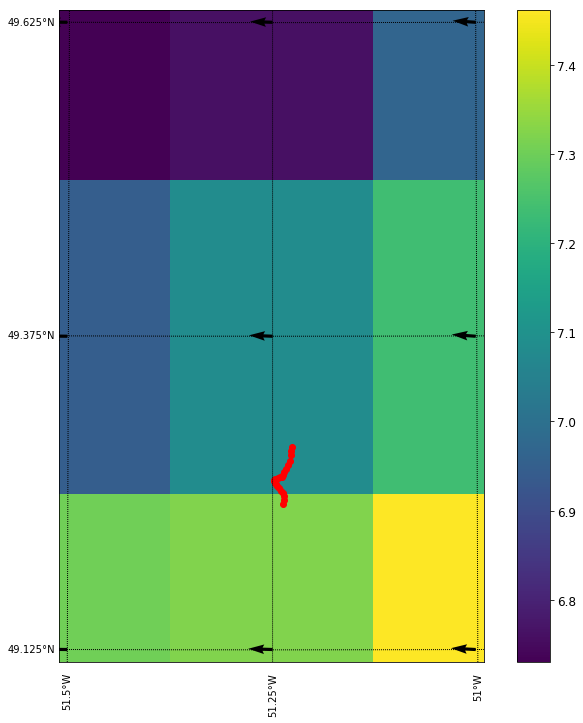

Optimizing Ca and Cw...


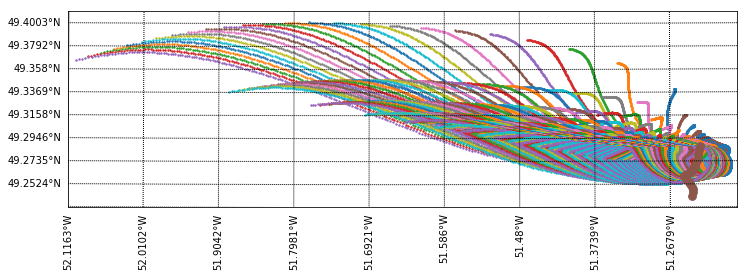

Plotting optimized track...
err: 0.024780188289302396, Ca: 0.7, Cw: 2.5


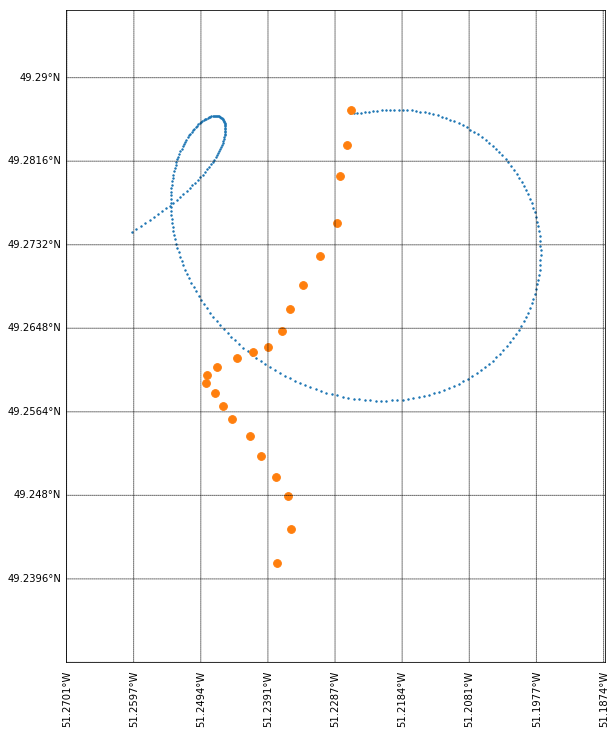

Running ensemble...


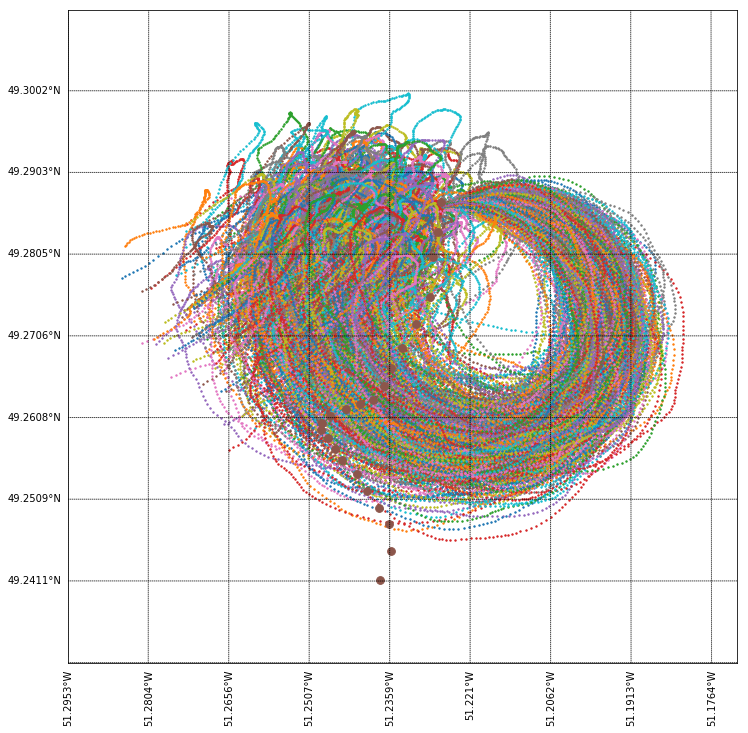

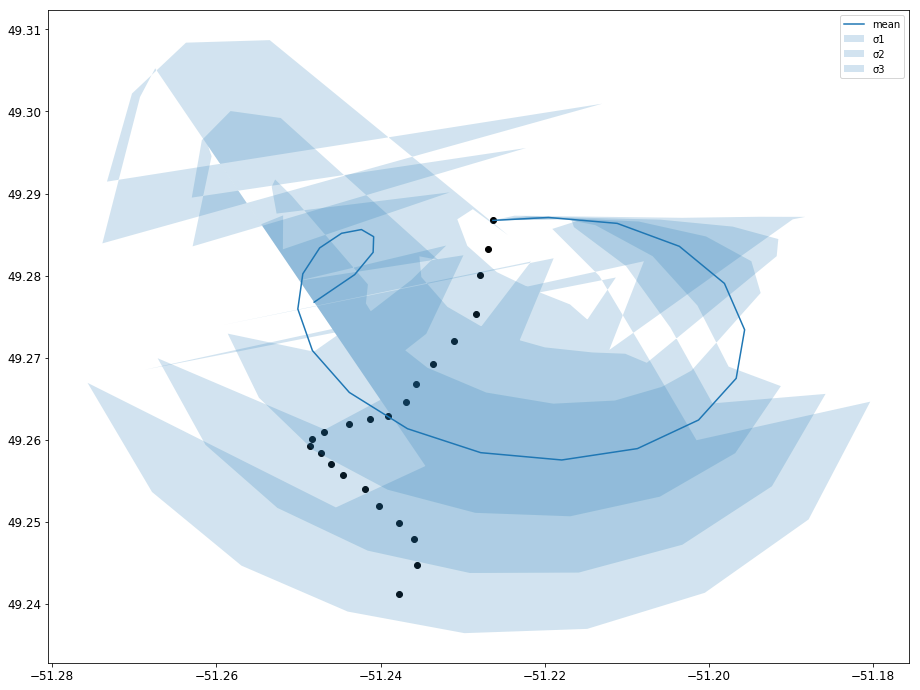

Day 3


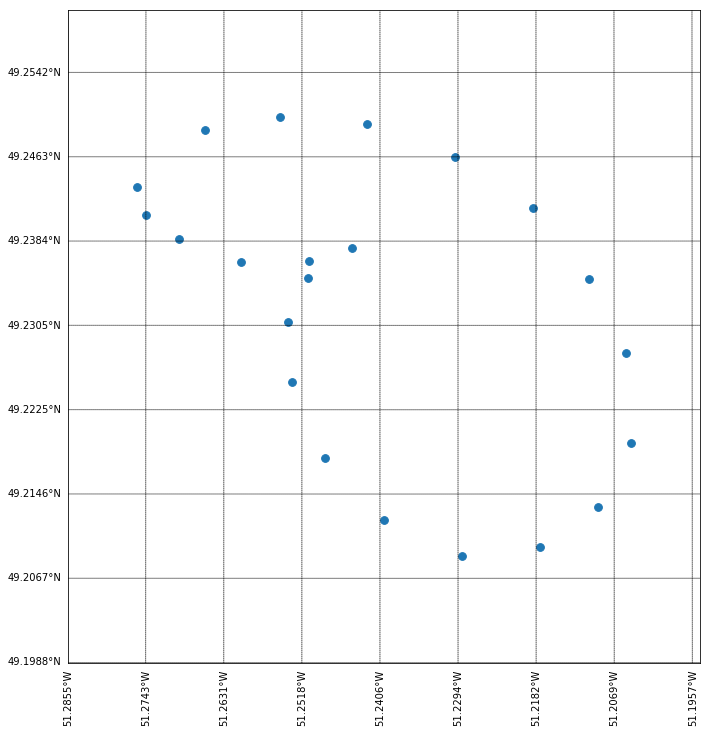

Plotting metocean data...


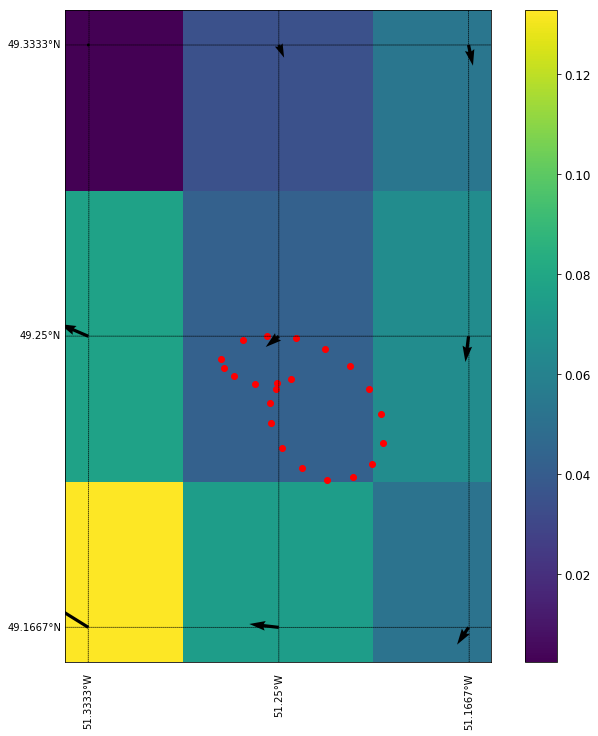

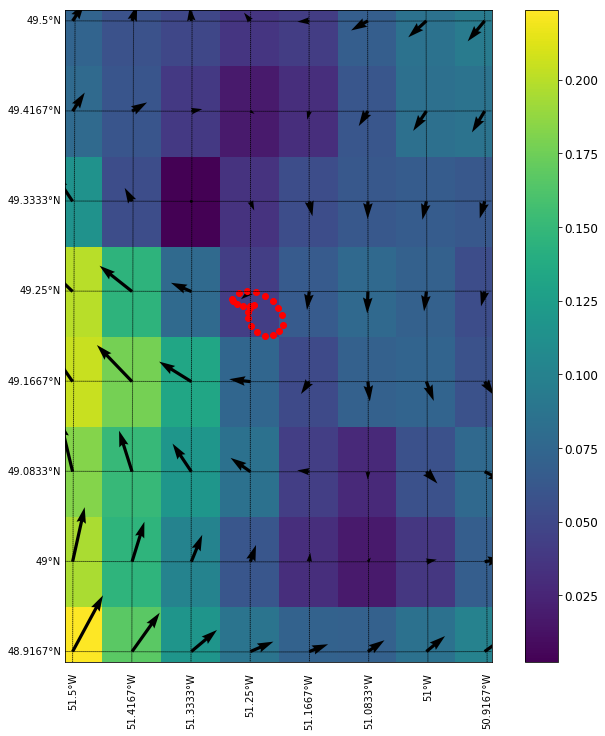

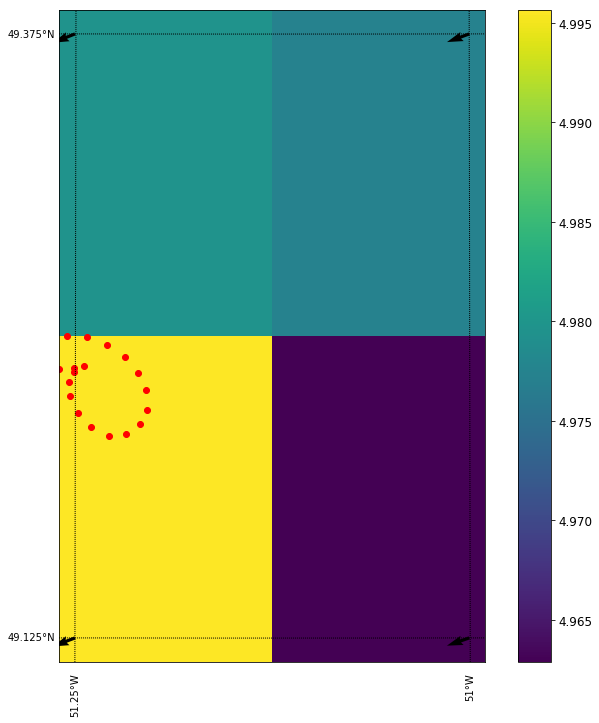

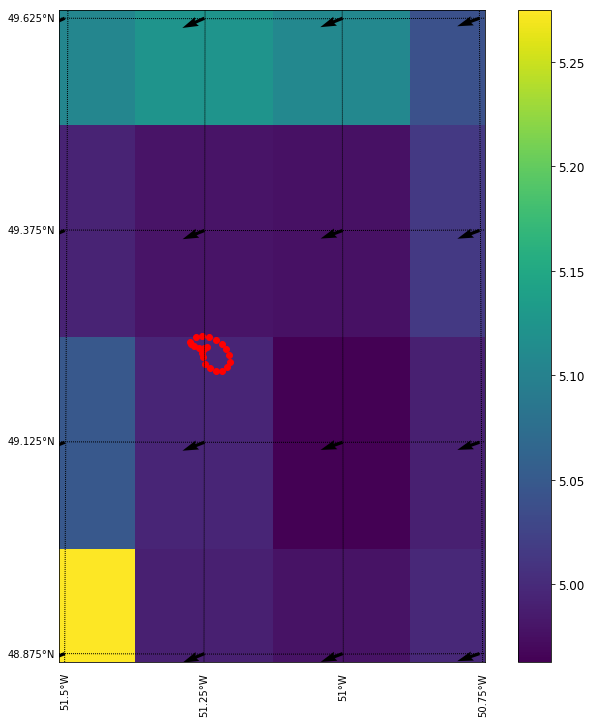

Optimizing Ca and Cw...


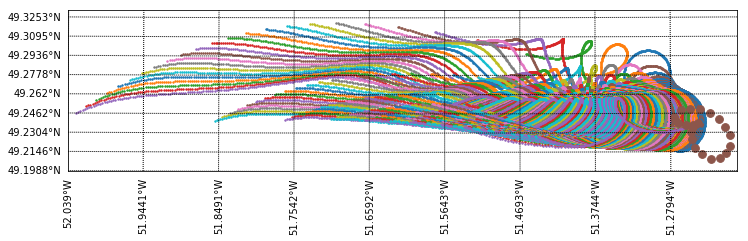

Plotting optimized track...
err: 0.03241993365964623, Ca: 0.1, Cw: 2.5


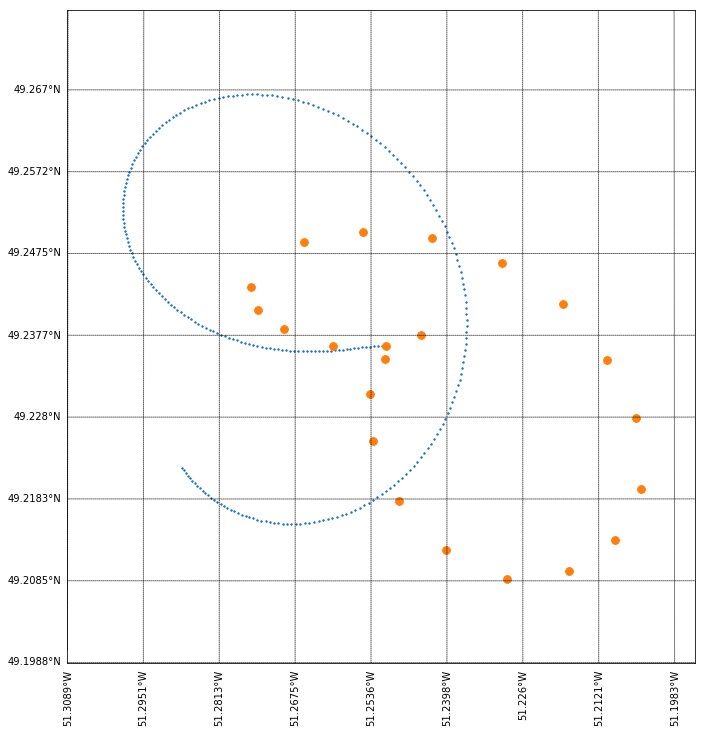

Running ensemble...


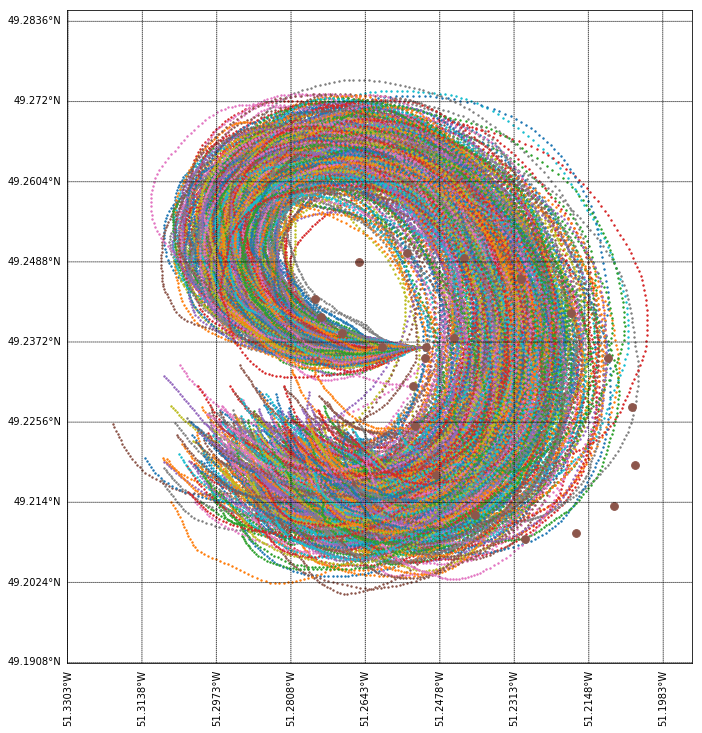

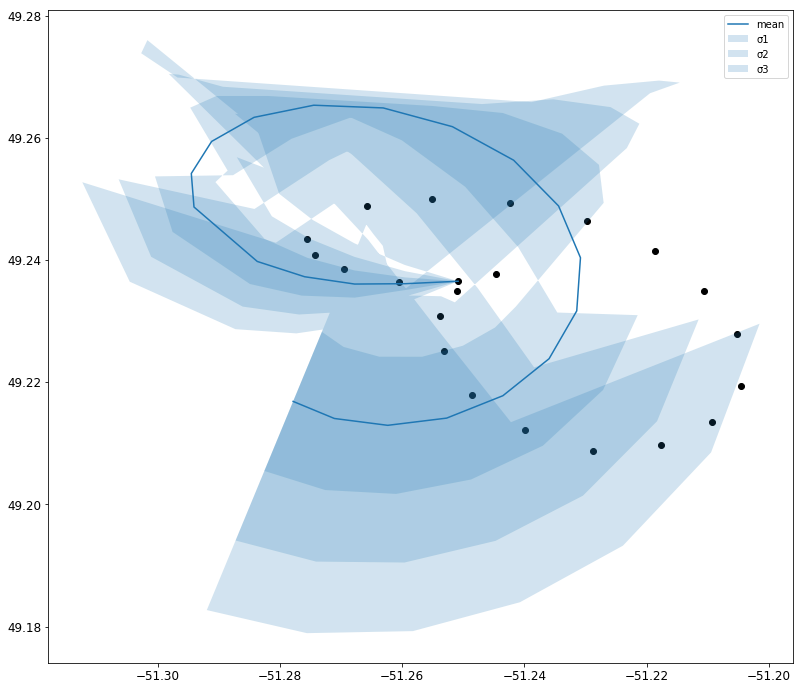

Day 4


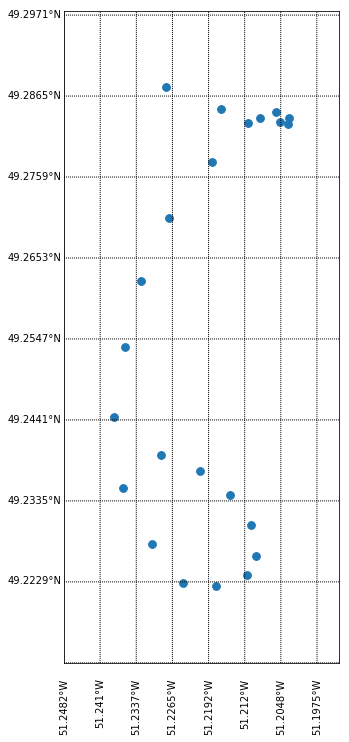

Plotting metocean data...


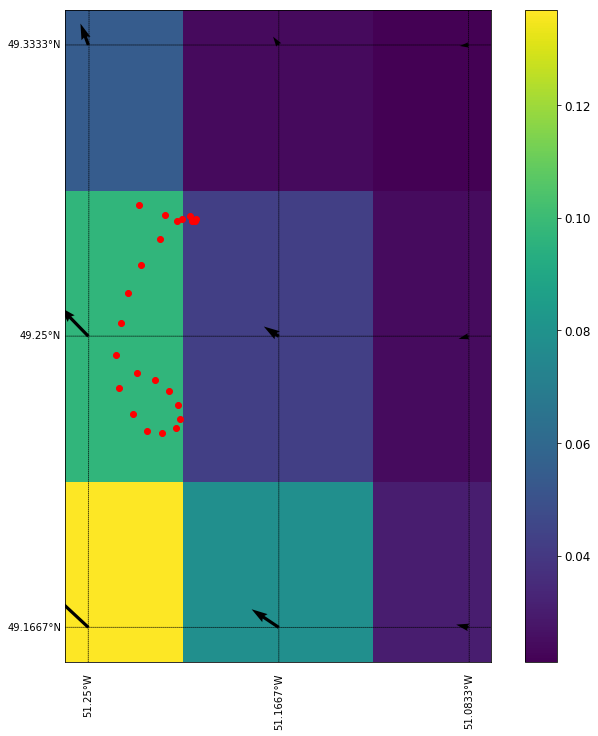

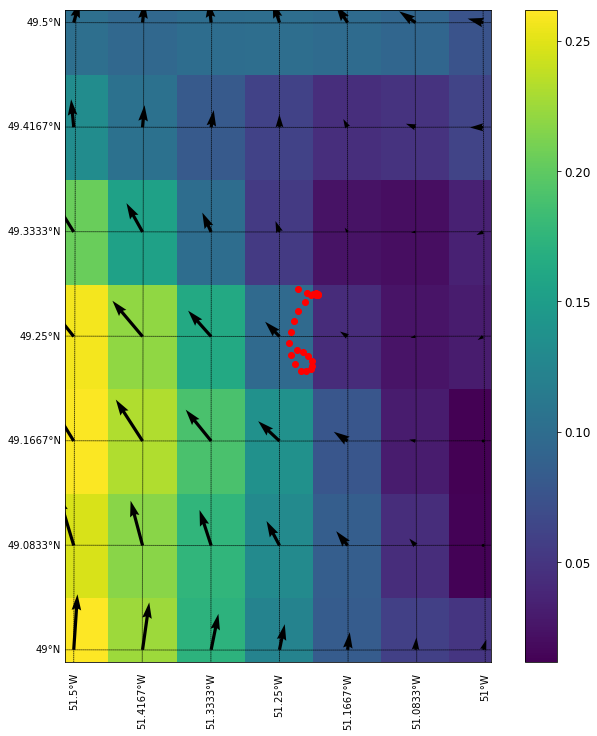

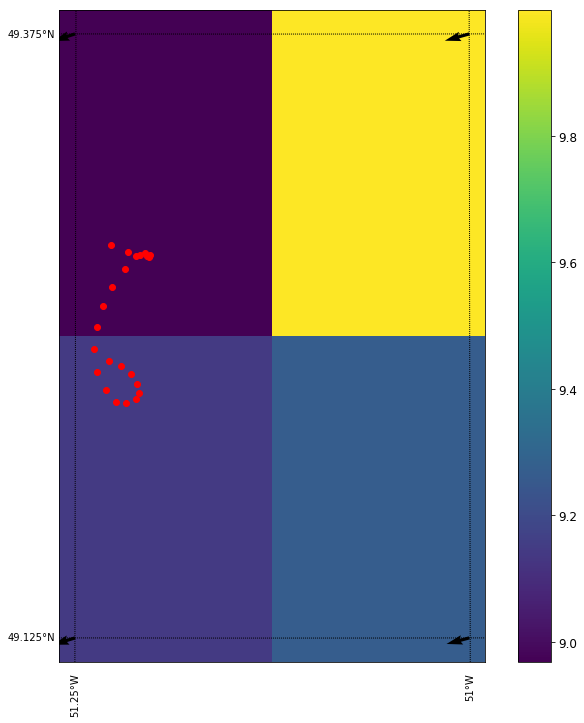

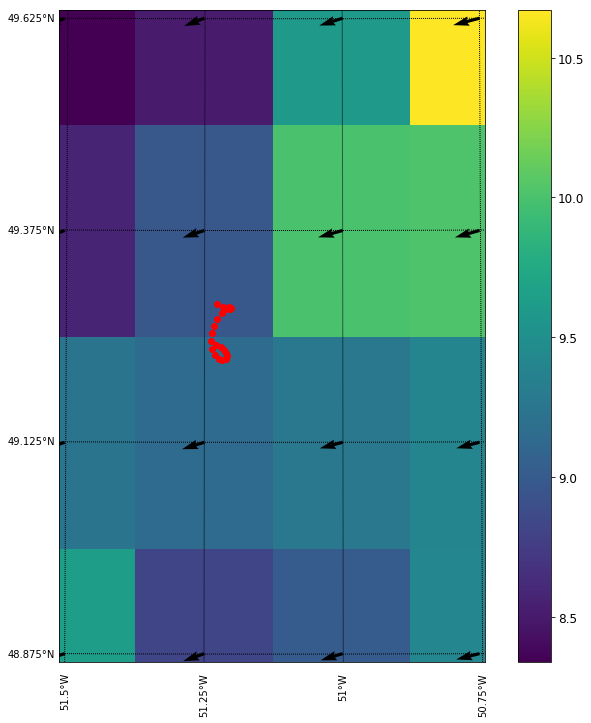

Optimizing Ca and Cw...


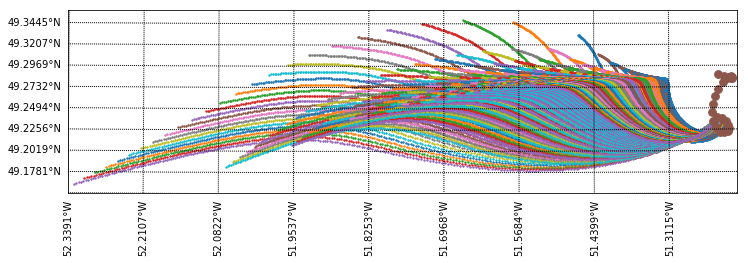

Plotting optimized track...
err: 0.054042053821163206, Ca: 0.1, Cw: 2.5


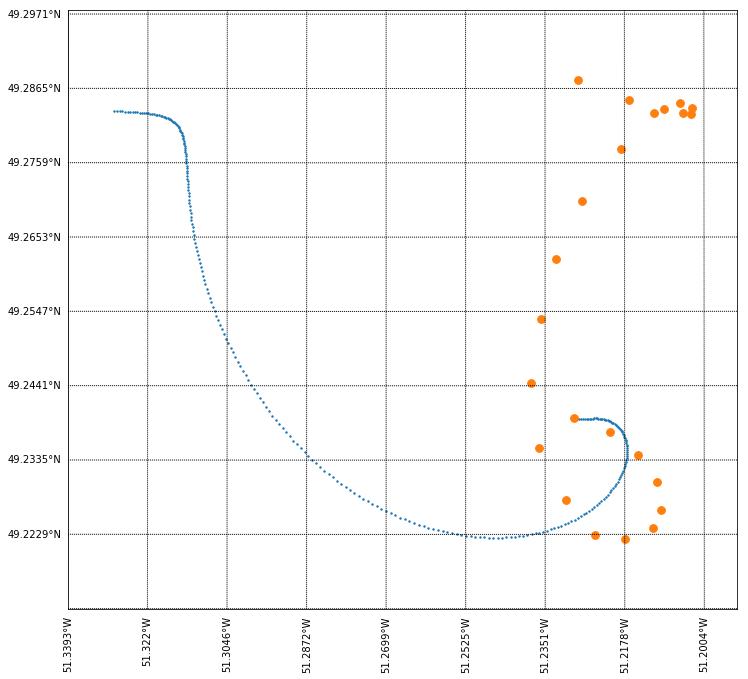

Running ensemble...


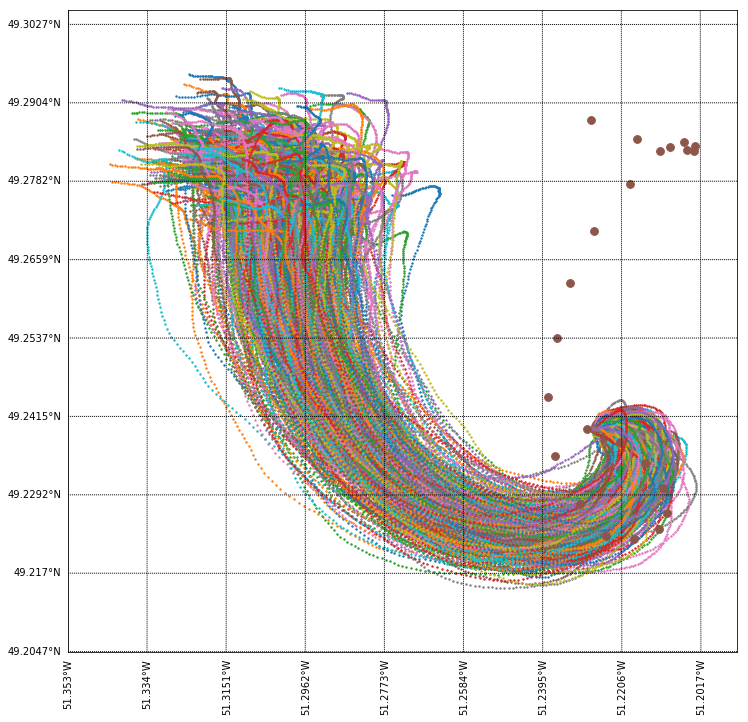

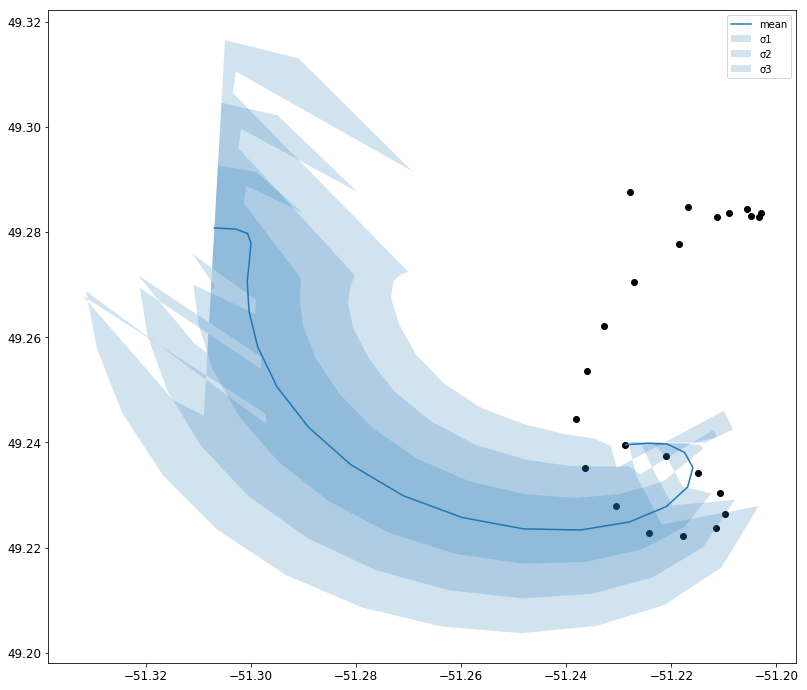

Day 5


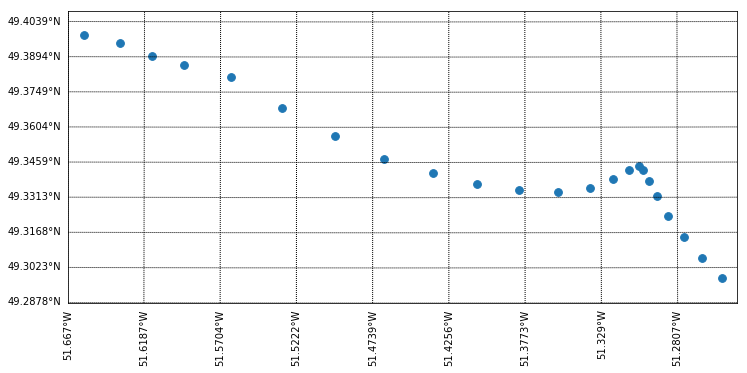

Plotting metocean data...


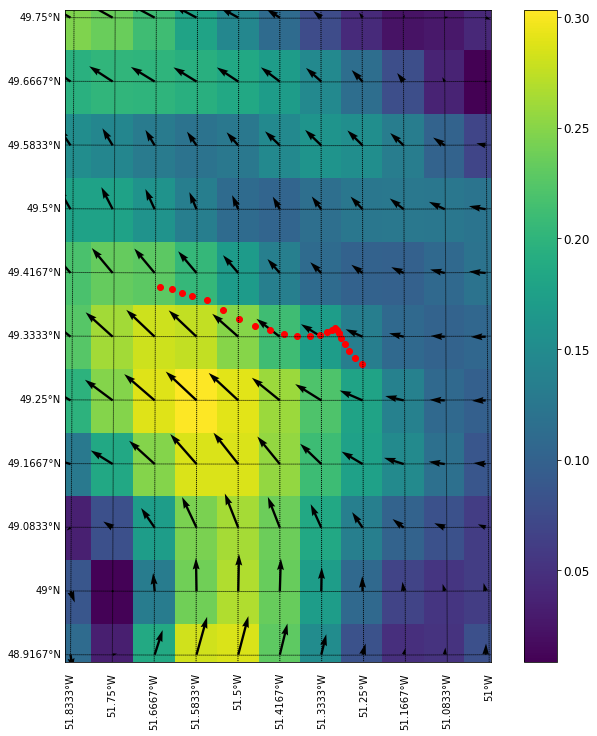

/home/evankielley/anaconda3/envs/icedef/lib/python3.6/site-packages/xarray/core/nanops.py:162: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


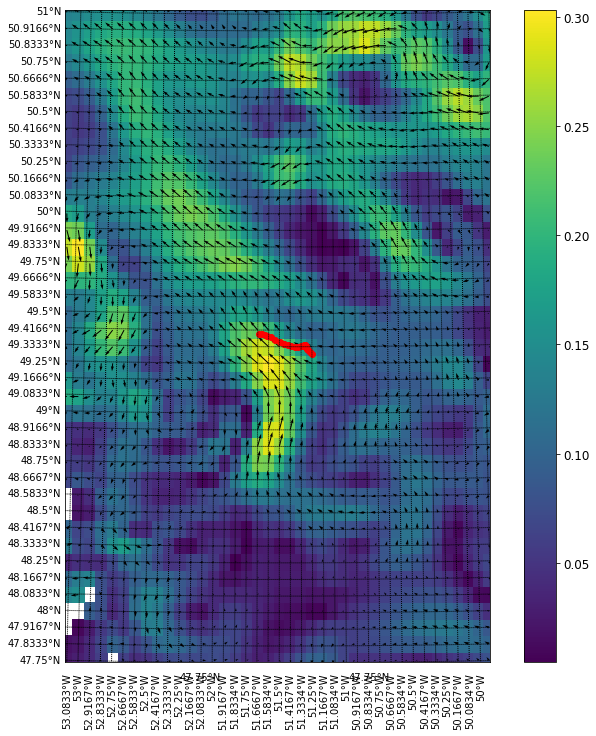

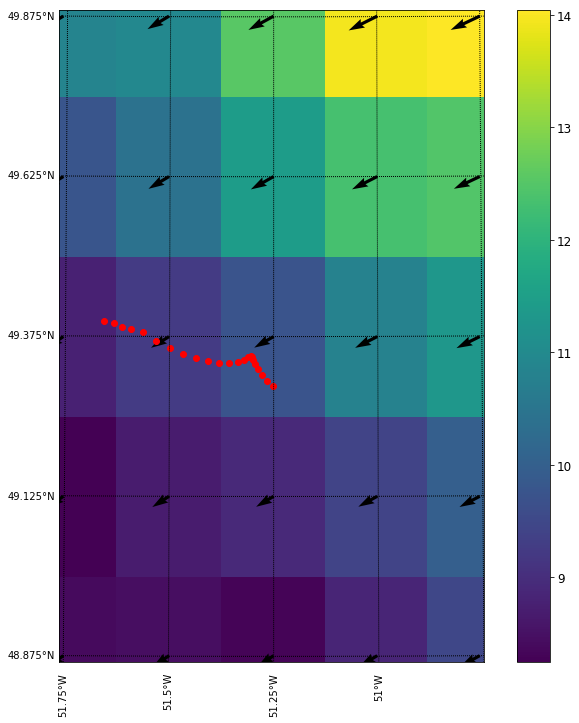

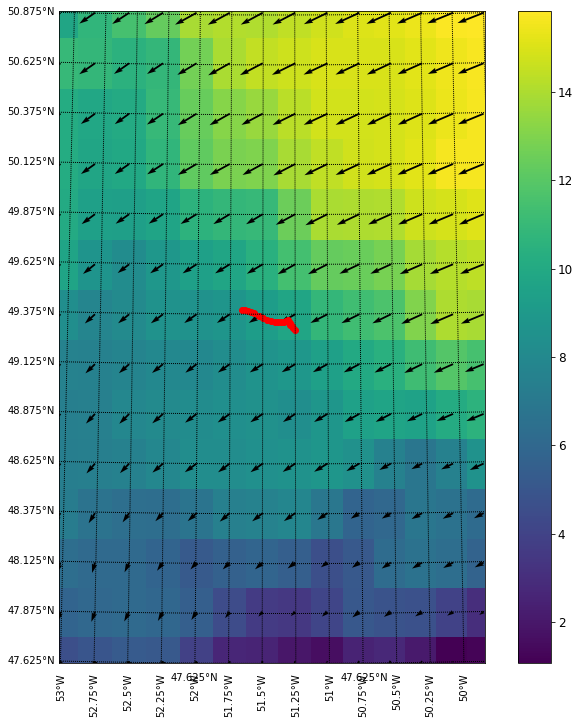

Optimizing Ca and Cw...


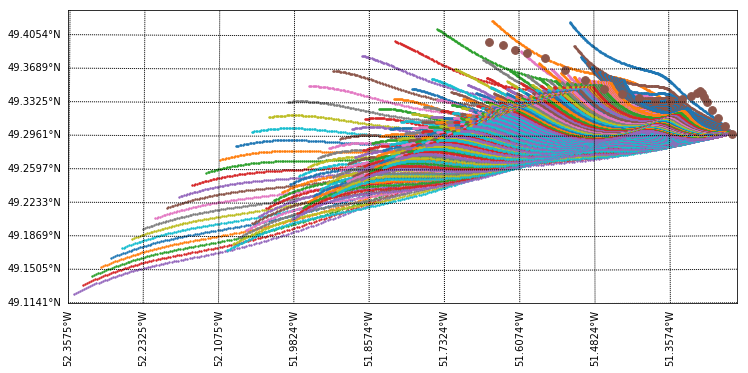

Plotting optimized track...
err: 0.0332495172129505, Ca: 0.2, Cw: 0.1


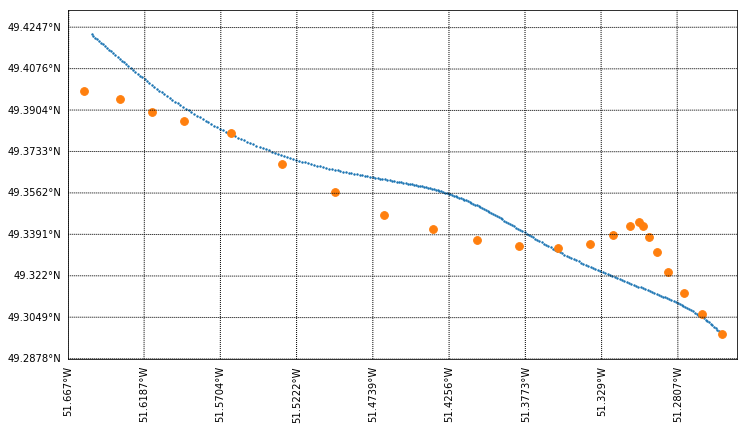

Running ensemble...


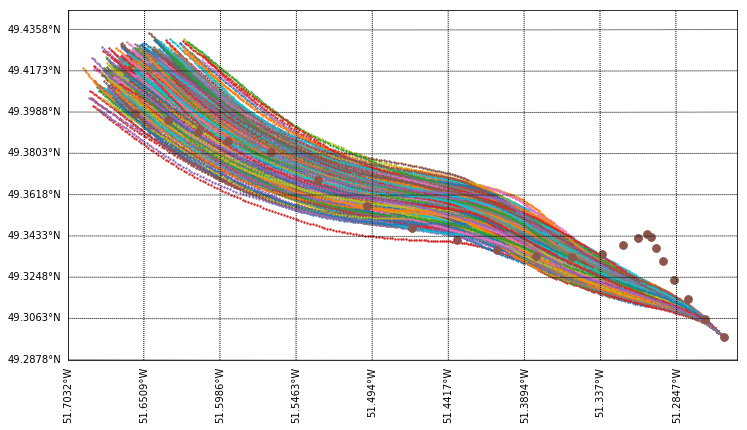

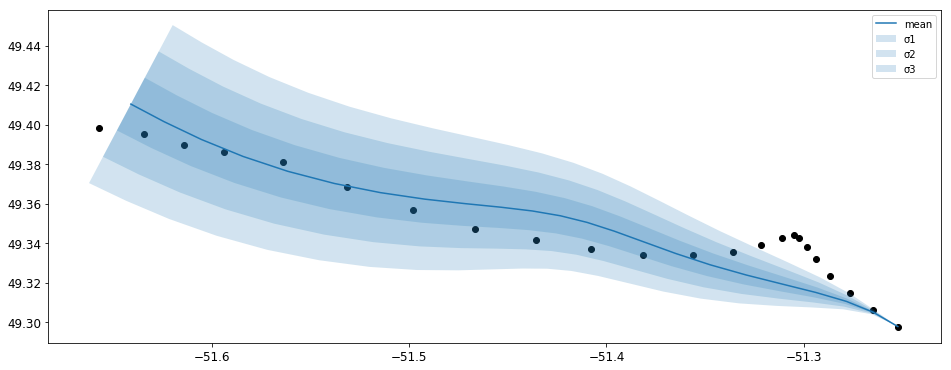

Day 6


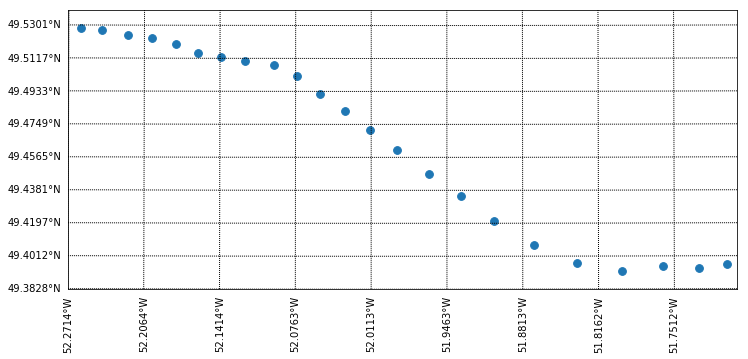

Plotting metocean data...


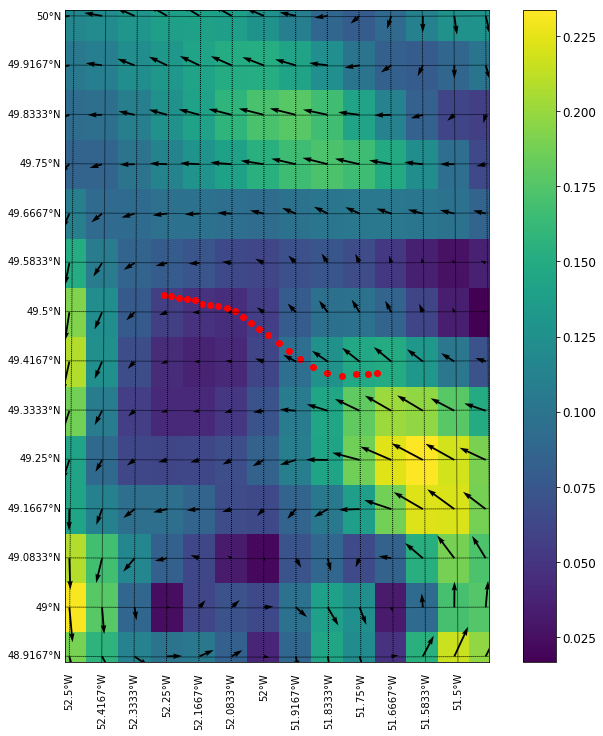

/home/evankielley/anaconda3/envs/icedef/lib/python3.6/site-packages/xarray/core/nanops.py:162: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


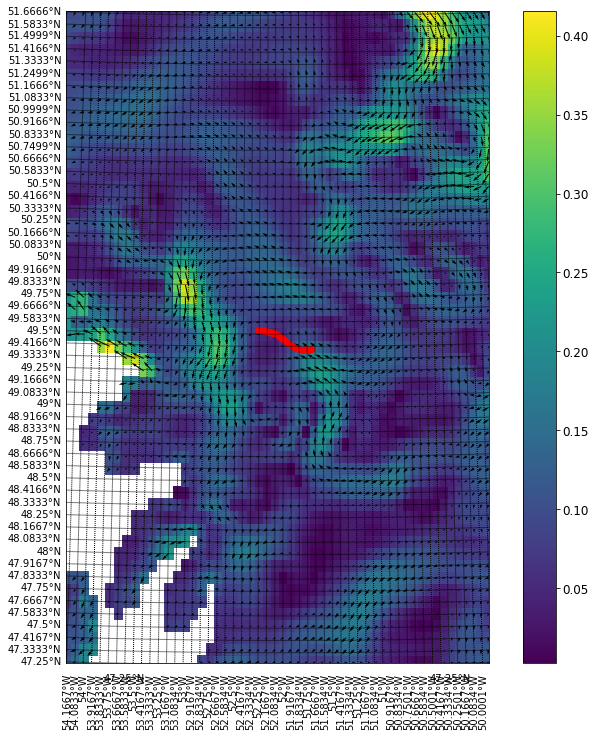

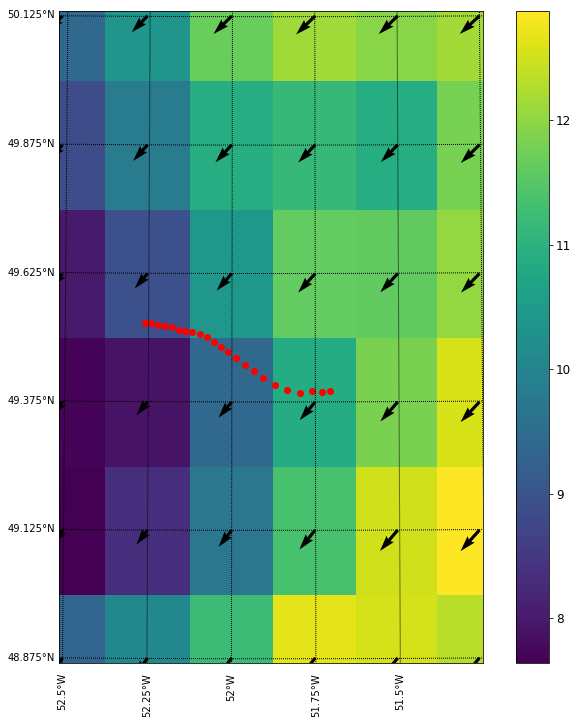

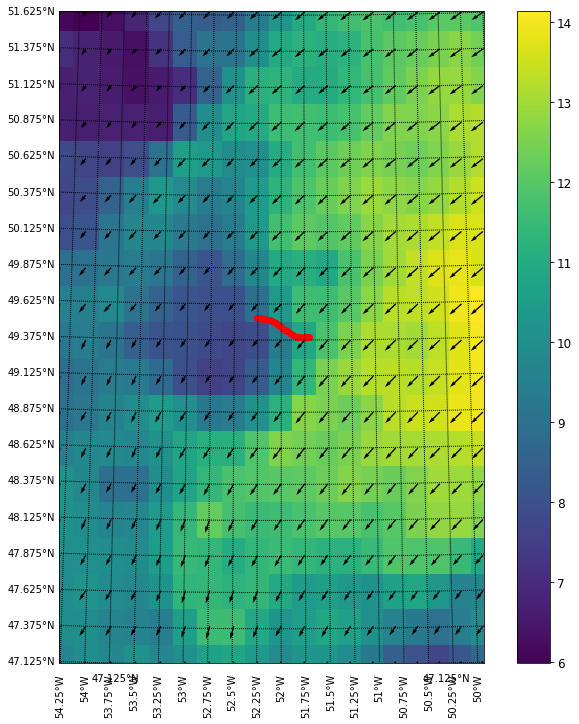

Optimizing Ca and Cw...


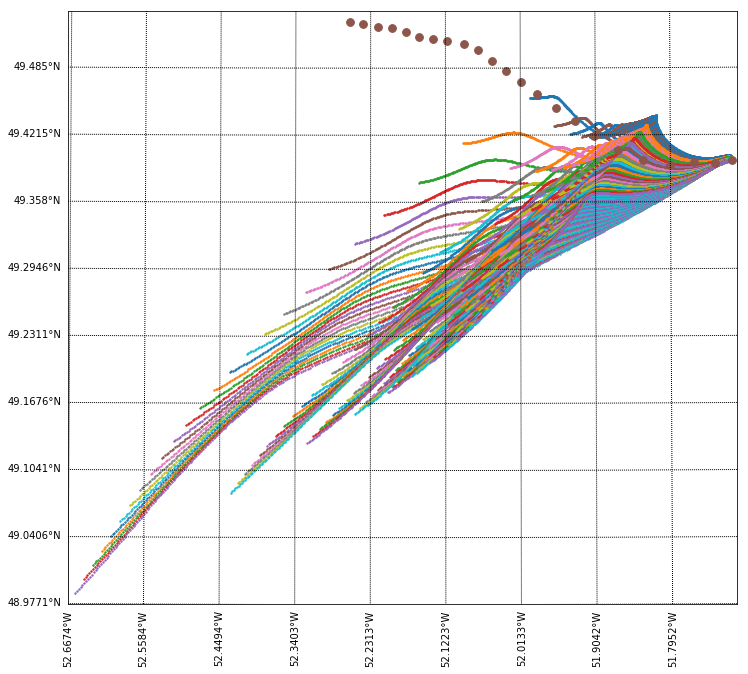

Plotting optimized track...
err: 0.09941404183715079, Ca: 0.3, Cw: 0.1


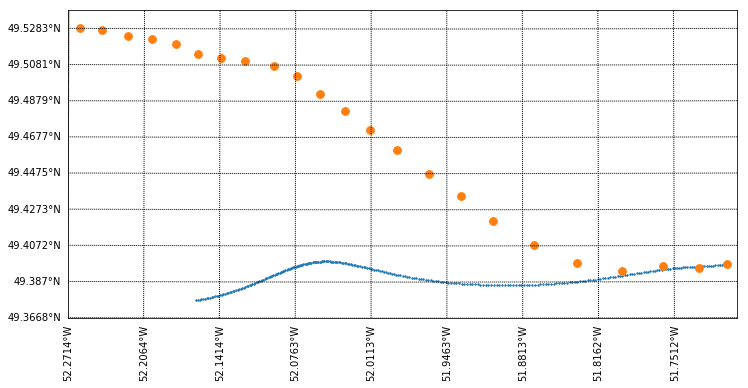

Running ensemble...


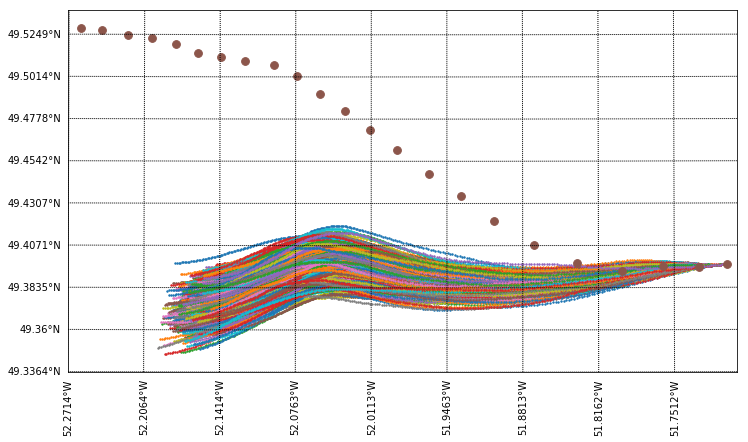

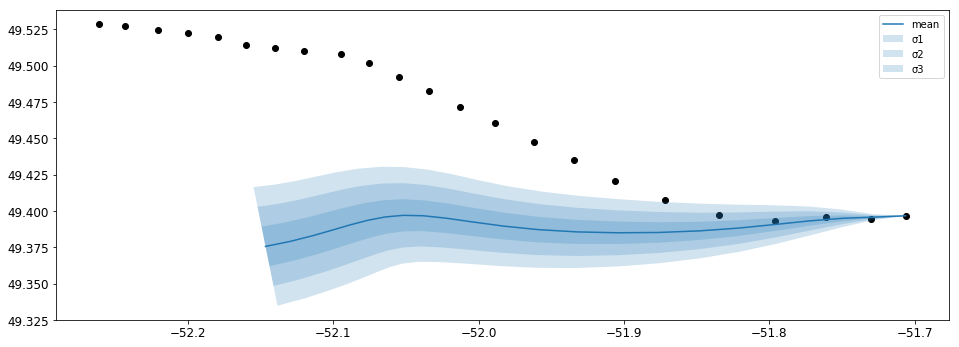

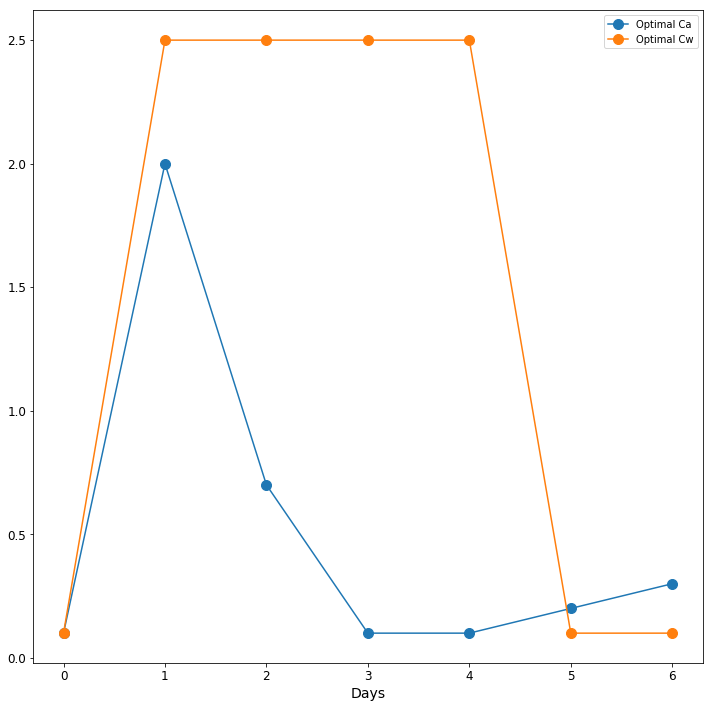

In [11]:
num_days = 7
days = range(num_days)
#days = [2]

optimal_Cas = np.empty(num_days)
optimal_Cws = np.empty(num_days)


for day in days:
    
    print(f'Day {day}')
    
    start_time = df.DataDate_UTC.values[537] + np.timedelta64(day, 'D')
    end_time = start_time + np.timedelta64(1, 'D')
    tc = test_case.TestCase(beacon_id=beacon_id, start_time=start_time, end_time=end_time)
    
    sim_args = tc.time_frame, tc.start_location, tc.start_velocity
    sim = simulator.Simulator(*sim_args, **{'ocean_model': 'ECMWF'})
    reference_data_dict = {'time': tc.ref_times, 'latitude': tc.ref_lats.values, 'longitude': tc.ref_lons.values}
    sim.results.add_from_dict(reference_data_dict, label='reference')
    sim.testcase = tc
    g = sim.iceberg.geometry
    g._size = None
    g.sail_height = 12
    g.waterline_length = 250
    g.mass = 4.2e9
    
    optimal_Cas[day], optimal_Cws[day] = main(tc, sim)
    
    del sim
    del tc
    
    gc.collect()

plt.plot(range(len(optimal_Cas)), optimal_Cas, '.-', markersize=20, label='Optimal Ca')
plt.plot(range(len(optimal_Cws)), optimal_Cws, '.-', markersize=20, label='Optimal Cw')
plt.xlabel('Days')
plt.legend()
plt.show()